# Youngest Stars from Solar Twins Data  🤠 🌟

In [1]:
#tools
from tqdm import tqdm
import numpy as np
import pandas as pd
from scipy import stats
from pandas import DataFrame
import matplotlib.pyplot as plt
import astropy.stats as astat
from solartwins import *
import pickle
from acfunctions import *
import eleanor
from IPython.display import Image
import lightkurve as lk
from starspot import sigma_clipping
import starspot as ss
from lightkurve import search_targetpixelfile
from IPython.display import display, HTML
import starspot.rotation_tools as rt
import exoplanet
import eleanor

/Users/ilanadoran/opt/anaconda3/lib/python3.7/site-packages/theano/configdefaults.py:560: UserWarning: DeprecationWarning: there is no c++ compiler.This is deprecated and with Theano 0.11 a c++ compiler will be mandatory
  warnings.warn("DeprecationWarning: there is no c++ compiler."
WARNING (theano.configdefaults): g++ not detected ! Theano will be unable to execute optimized C-implementations (for both CPU and GPU) and will default to Python implementations. Performance will be severely degraded. To remove this warning, set Theano flags cxx to an empty string.
WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
rc('text', usetex=False)

# Importing lists from 'SolarTwinsandLightKurve' 

In [3]:
#list of stars in tess with two minute cadences
with open('two_result.data', 'rb') as filehandle:
    search_result_two = pickle.load(filehandle)

#stars with thirty minute cadences
with open('thirty_result.data', 'rb') as filehandle:
    search_result_thirty = pickle.load(filehandle)

#names of stars with thirty minute cadences
with open('thirty_m_cadence.data', 'rb') as filehandle:
    thirty_m_cadence = pickle.load(filehandle)
    
#names of stars with two minute cadences
with open('two_m_cadence.data', 'rb') as filehandle:
    two_m_cadence = pickle.load(filehandle)

# Organizing lists

In [4]:
#list of ages of stars with thirty minute cadences
thirty_age = []
for ii, star in enumerate(thirty_m_cadence):
    for i, txt in enumerate(t['star_name']):
        if txt == star:
            thirty_age.append(t[i][1]) #adding ages of 30 min stars to list

thirty = dict(zip(thirty_m_cadence, thirty_age)) # dictionary of 30 m stars and their ages

In [5]:
#list of ages of stars with two minute cadences
two_age = []
for jj, tstar in enumerate(two_m_cadence):
    for j, text in enumerate(t['star_name']):
        if text == tstar:
            two_age.append(t[j][1]) #adding ages
            
two = dict(zip(two_m_cadence, two_age)) #dictionary of names and ages

In [6]:
#picking out the youngest stars and their ages, combining 30m and 2m data
young = []
ages = []
for tt, val in enumerate(thirty_m_cadence):
    if thirty[val] < 2:  # adding the youngest stars to list
        young.append(val)
        ages.append(thirty[val])
        
for tt, val in enumerate(two_m_cadence):
    if two[val] < 2: 
        young.append(val)
        ages.append(two[val])

In [7]:
young_stars = dict(zip(young, ages))

#saving to text file 
#with open('young_stars_dict.data', 'wb') as filehandle:
    #pickle.dump(young_stars, filehandle)
    
young_stars

{'HIP36515': 0.5,
 'HIP38072': 1.3,
 'HIP105184': 0.7,
 'HIP114615': 1.1,
 'HIP22263': 0.7,
 'HIP29525': 1.2,
 'HIP3203': 0.5,
 'HIP42333': 1.2,
 'HIP43297': 1.9,
 'HIP54102': 0.7,
 'HIP9349': 0.7}

In [152]:
young_star_names = []

[TessLightCurve(TICID: 139112038),
 TessLightCurve(TICID: 218966119),
 TessLightCurve(TICID: 117979951),
 TessLightCurve(TICID: 153498031),
 TessLightCurve(TICID: 3816118),
 TessLightCurve(TICID: 51443167),
 TessLightCurve(TICID: 262587669),
 TessLightCurve(TICID: 305573888),
 TessLightCurve(TICID: 423752904),
 TessLightCurve(TICID: 173673173),
 TessLightCurve(TICID: 31716749)]

In [153]:
with open('young_star_names.data', 'wb') as filehandle:
    pickle.dump(young_star_names, filehandle)

In [9]:
print(search_result_two[3])

SearchResult containing 1 data products.

 #   observation  target_name                     productFilename                     distance
--- ------------- ----------- ------------------------------------------------------- --------
  0 TESS Sector 1   139112038 tess2018206045859-s0001-0000000139112038-0120-s_tp.fits      0.0


# Young Stars, Autocorrelated

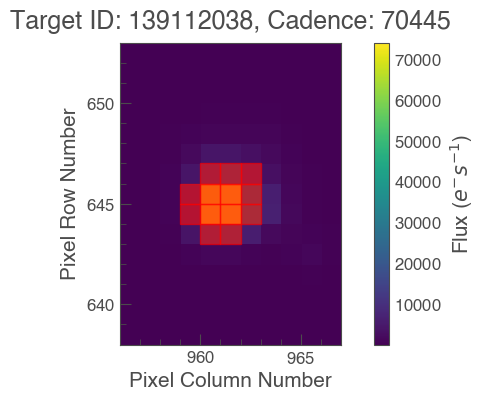

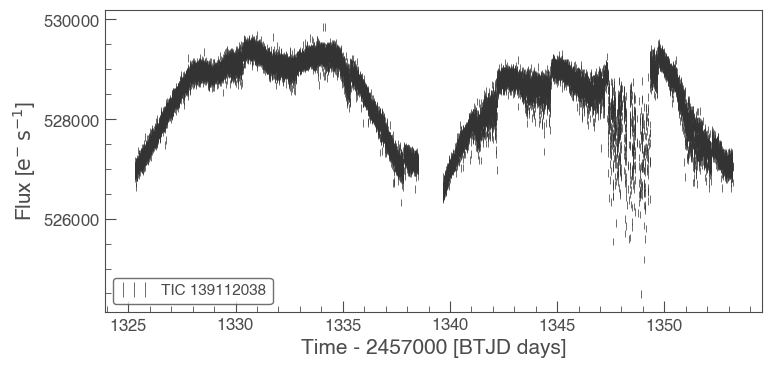

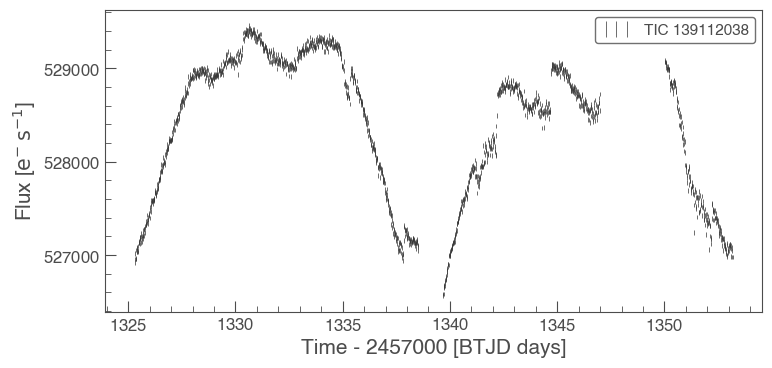

In [10]:
star3 = search_result_two[3].download(quality_bitmask='default')
#star3.interact()
#star3.interact_sky()

target_mask_3 = star3.create_threshold_mask(threshold=40, reference_pixel= 'center')
star3.plot(aperture_mask=target_mask_3, mask_color='r');

lc3 = star3.to_lightcurve()
lc3.errorbar()

lc_3 = lc3[(lc3.time < 1347) | (lc3.time > 1350)]
lc_3.remove_outliers(sigma=3).bin(binsize=10).errorbar();

young_stars[two_m_cadence[3]]
young_star_names.append(lc_3) #adding star to my list

In [154]:
ac_3 = ac_mcquillan_set_k(young_star_names[0])
plt.scatter(ac_3[1], ac_3[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 3', fontsize = 25)

TypeError: cannot unpack non-iterable numpy.int64 object

In [13]:
tess_mq1 = (search_result_two[3]).download_all(quality_bitmask='default')
print(tess_mq1[0].targetid)

139112038


In [14]:
tpf_Q1 = tess_mq1[0].to_lightcurve(aperture_mask=tess_mq1[0].pipeline_mask)
 
flux_nans_Q1 = tpf_Q1.flux[0:]
Q1_time = tpf_Q1.time[0:]
norm_flux_err_Q1 = tpf_Q1.flux_err[0:]
    
flux_mask_Q1 = astat.sigma_clip(flux_nans_Q1, sigma=2, masked = True)
flux_Q1 = flux_nans_Q1[~flux_mask_Q1.mask]
Q1_time = Q1_time[~flux_mask_Q1.mask]
flux_err_Q1 = norm_flux_err_Q1[~flux_mask_Q1.mask]
    
med_Q1 = np.median(flux_Q1)
flux_normalized_Q1 = flux_Q1[0:]/med_Q1 - 1
norm_flux_err_Q1 = flux_err_Q1[0:]/med_Q1

tess_time_mq1_tess = Q1_time
tess_flux_mq1_tess = flux_normalized_Q1
tess_flux_error_mq1_tess = norm_flux_err_Q1

Text(0, 0.5, 'Normalized Flux')

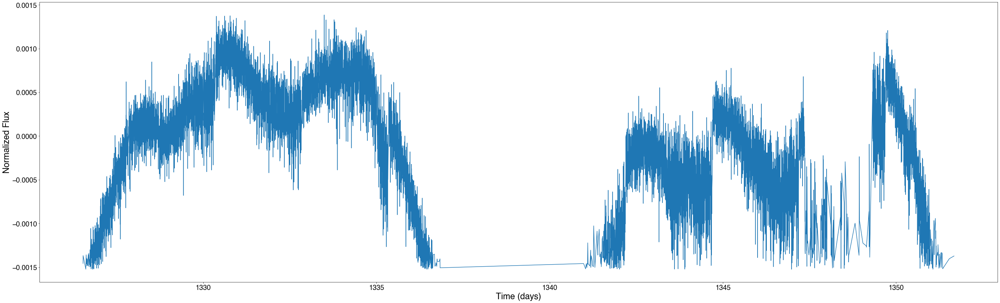

In [15]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_mq1_tess, tess_flux_mq1_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

acf_tess_1 = ac_mq_tess("319.6136, -43.3347", 1000);

plt.figure(figsize=(10,5))
plt.scatter(acf_tess_1[1], acf_tess_1[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS Autocorrelated Figure 1', fontsize = 25)

In [16]:
rotate_tess_mq1 = ss.RotationModel(tess_time_mq1_tess, tess_flux_mq1_tess, tess_flux_error_mq1_tess)

In [17]:
ys1 = exoplanet.lomb_scargle_estimator(tess_time_mq1_tess, tess_flux_mq1_tess, yerr= tess_flux_error_mq1_tess, 
                                      max_period= 10, max_peaks=2)

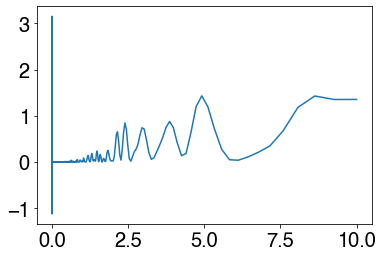

In [18]:
plt.plot(1/(ys1['periodogram'][0]), ys1['periodogram'][1])

16.328180108158946


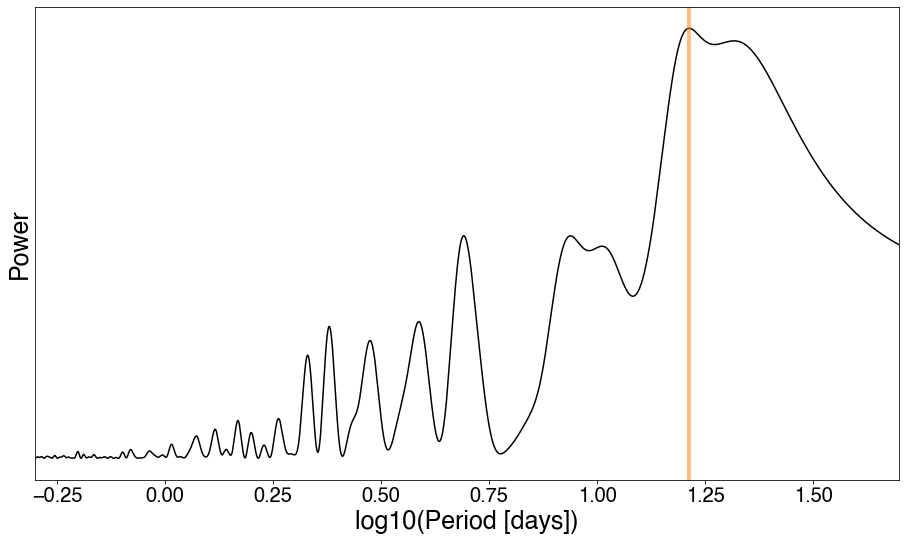

In [19]:
tess_period_mq1_tess = rotate_tess_mq1.ls_rotation()
print(tess_period_mq1_tess)
rotate_tess_mq1.ls_plot();

In [20]:
period_grid_tessmq1_tess = np.linspace(.1, 10, 1000)
pdm_period_tessmq1_tess, period_err_tessmq1_tess = rotate_tess_mq1.pdm_rotation(period_grid_tessmq1_tess, pdm_nbins=10)
print(pdm_period_tessmq1_tess, period_err_tessmq1_tess)

100%|██████████| 1000/1000 [00:09<00:00, 100.54it/s]


fitting to a limited range
9.633333333333335 1.3108355080409615


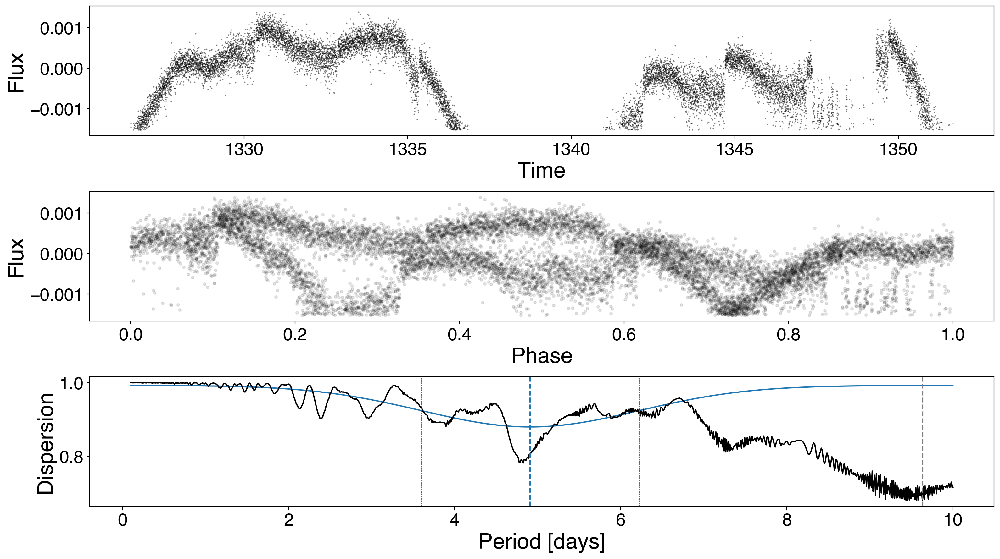

In [21]:
rotate_tess_mq1.pdm_plot();

1.1

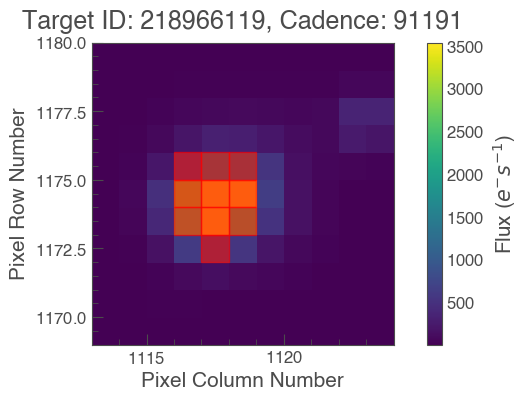

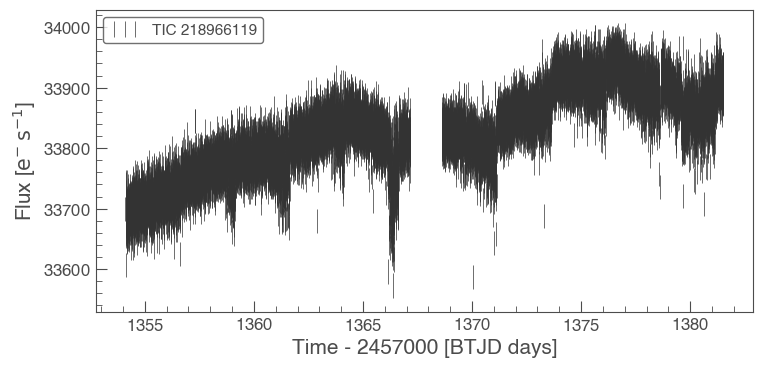

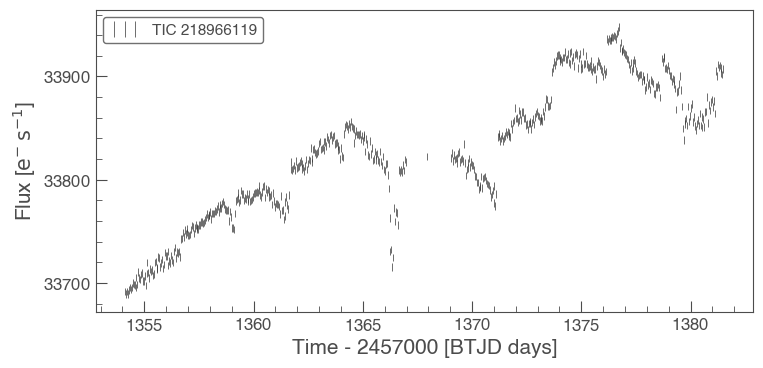

In [22]:
star5 = search_result_two[5].download(quality_bitmask='default')
#star5.interact()
#star5.interact_sky()

target_mask_5 = star5.create_threshold_mask(threshold=15, reference_pixel= 'center')
star5.plot(aperture_mask=target_mask_5, mask_color='r');

lc5 = star5.to_lightcurve(aperture_mask=target_mask_5)
lc5.errorbar()

lc_5 = lc5[(star5.time < 1367) | (star5.time > 1369)]
lc_5.remove_outliers(sigma=3).bin(binsize=30).errorbar();
young_star_names.append(lc_5)

young_stars[two_m_cadence[5]]

In [23]:
ac_5 = ac_mcquillan_set_k(young_star_names[1])
plt.scatter(ac_5[1], ac_5[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 5', fontsize = 25)

TypeError: cannot unpack non-iterable numpy.int64 object

In [24]:
tess_ys1 = (search_result_two[5]).download_all(quality_bitmask='default')
print(tess_ys1[0].targetid)

218966119


In [25]:
tpf_ys1 = tess_ys1[0].to_lightcurve(aperture_mask=tess_ys1[0].pipeline_mask)
flux_nans_ys1 = tpf_ys1.flux[0:]
ys1_time = tpf_ys1.time[0:]
norm_flux_err_ys1 = tpf_ys1.flux_err[0:]
    
flux_mask_ys1 = astat.sigma_clip(flux_nans_ys1, sigma=3, masked = True)
flux_ys1 = flux_nans_ys1[~flux_mask_ys1.mask]
ys1_time = ys1_time[~flux_mask_ys1.mask]
flux_err_ys1 = norm_flux_err_ys1[~flux_mask_ys1.mask]
    
med_ys1 = np.median(flux_ys1)
flux_normalized_ys1 = flux_ys1[0:]/med_ys1 - 1
norm_flux_err_ys1 = flux_err_ys1[0:]/med_ys1

tess_time_ys1_tess = ys1_time
tess_flux_ys1_tess = flux_normalized_ys1
tess_flux_error_ys1_tess = norm_flux_err_ys1

Text(0, 0.5, 'Normalized Flux')

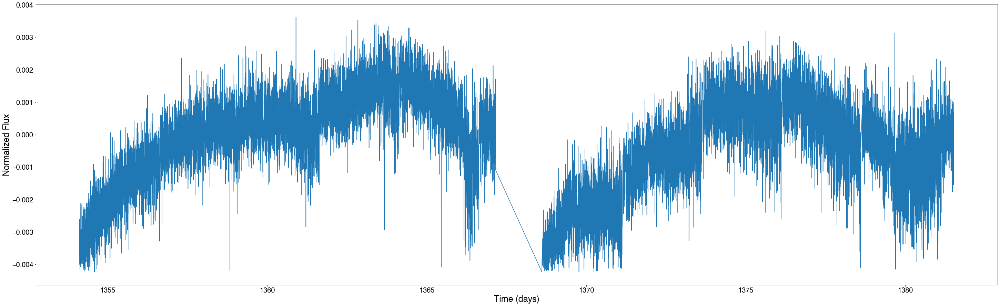

In [26]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_ys1_tess, tess_flux_ys1_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

In [27]:
acf_tess_ys1 = ac_mq_tess("348.2909, -30.4498", 1000);

KeyboardInterrupt: 

In [28]:
plt.figure(figsize=(10,5))
plt.scatter(acf_tess_ys1[1], acf_tess_ys1[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS 1 Autocorrelated', fontsize = 25)

NameError: name 'acf_tess_ys1' is not defined

<Figure size 720x360 with 0 Axes>

In [29]:
rotate_tess_ys1 = ss.RotationModel(tess_time_ys1_tess, tess_flux_ys1_tess, tess_flux_error_ys1_tess)

In [30]:
exo1 = exoplanet.lomb_scargle_estimator(tess_time_ys1_tess, tess_flux_ys1_tess, yerr=  tess_flux_error_ys1_tess, max_period= 10, max_peaks=2)

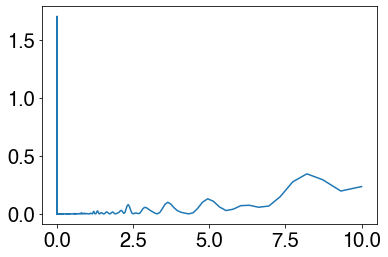

In [31]:
plt.plot(1/(exo1['periodogram'][0]), exo1['periodogram'][1])

14.302816538798208


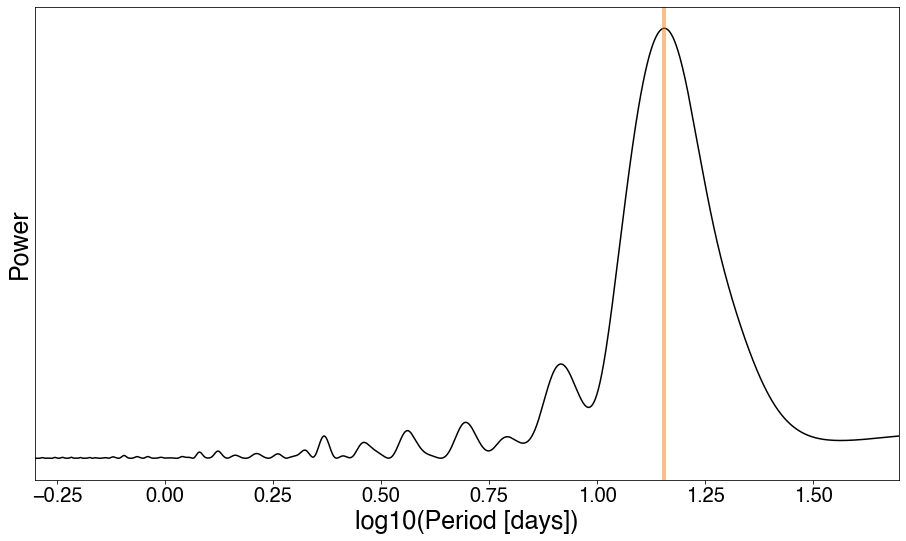

In [32]:
tess_period_ys1_tess = rotate_tess_ys1.ls_rotation()
print(tess_period_ys1_tess)
rotate_tess_ys1.ls_plot();

In [33]:
period_grid_tessys1_tess = np.linspace(.1, 10, 1000)
pdm_period_tessys1_tess, period_err_tessys1_tess = rotate_tess_ys1.pdm_rotation(period_grid_tessys1_tess, pdm_nbins=10)
print(pdm_period_tessys1_tess, period_err_tessys1_tess)

100%|██████████| 1000/1000 [00:12<00:00, 83.26it/s]

8.473873873873874 1.5770240645574722


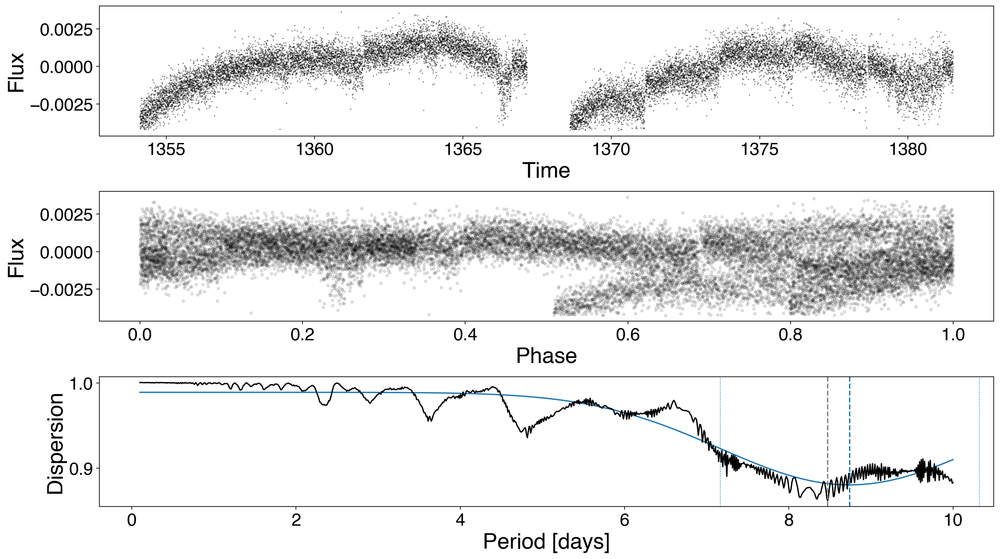

In [34]:
rotate_tess_ys1.pdm_plot();

0.7

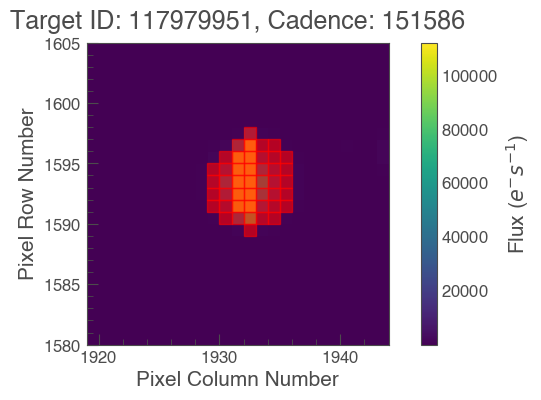

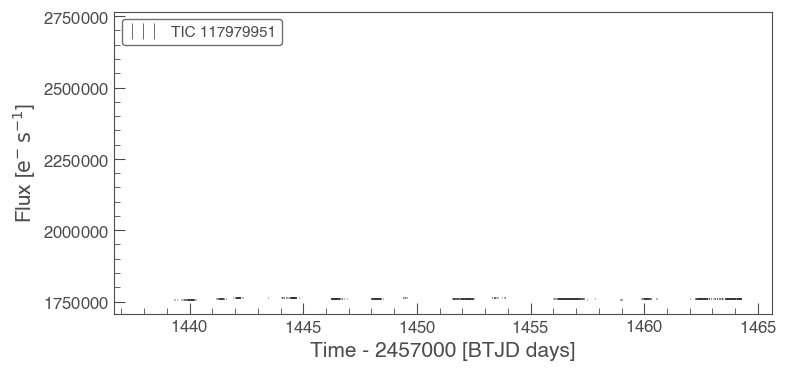

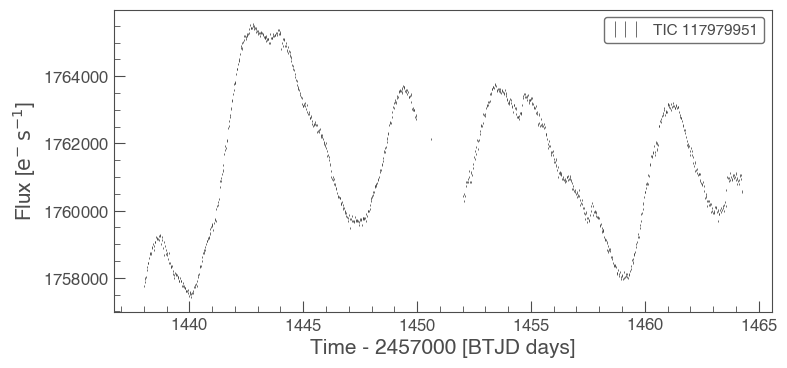

In [35]:
star9 = search_result_two[9].download(quality_bitmask='default')
#star9.interact()
#star9.interact_sky()

target_mask_9 = star9.create_threshold_mask(threshold=70, reference_pixel= 'center')
star9.plot(aperture_mask=target_mask_9, mask_color='r');

lc9 = star9.to_lightcurve(aperture_mask=target_mask_9)
lc9.errorbar()

lc_9 = lc9[(star9.time < 1450) | (star9.time > 1452)]
lc_9.remove_outliers(sigma=3).bin(binsize=20).errorbar();

young_star_names.append(lc_9)
young_stars[two_m_cadence[9]]

In [36]:
ac_9 = ac_mcquillan_set_k(young_star_names[2])
plt.scatter(ac_9[1], ac_9[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 9', fontsize = 25)

TypeError: cannot unpack non-iterable numpy.int64 object

In [37]:
tess_ys2 = (search_result_two[9]).download_all(quality_bitmask='default')
print(tess_ys2[0].targetid)

117979951


In [38]:
tpf_ys2 = tess_ys2[0].to_lightcurve(aperture_mask=tess_ys2[0].pipeline_mask)

In [39]:
flux_nans_ys2 = tpf_ys2.flux[0:]
ys2_time = tpf_ys2.time[0:]
norm_flux_err_ys2 = tpf_ys2.flux_err[0:]
    
flux_mask_ys2 = astat.sigma_clip(flux_nans_ys2, sigma=2, masked = True)
flux_ys2 = flux_nans_ys2[~flux_mask_ys2.mask]
ys2_time = ys2_time[~flux_mask_ys2.mask]
flux_err_ys2 = norm_flux_err_ys2[~flux_mask_ys2.mask]
    
med_ys2 = np.median(flux_ys2)
flux_normalized_ys2 = flux_ys2[0:]/med_ys2 - 1
norm_flux_err_ys2 = flux_err_ys2[0:]/med_ys2

tess_time_ys2_tess = ys2_time
tess_flux_ys2_tess = flux_normalized_ys2
tess_flux_error_ys2_tess = norm_flux_err_ys2

Text(0, 0.5, 'Normalized Flux')

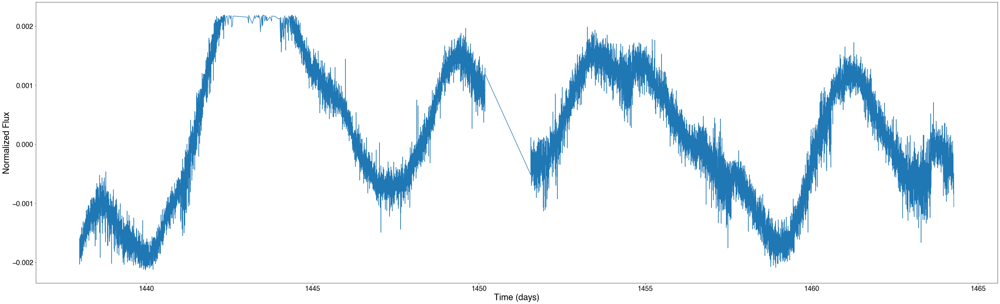

In [40]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_ys2_tess, tess_flux_ys2_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

In [41]:
acf_tess_2 = ac_mq_tess("71.9012, -16.9345", 1000);

KeyboardInterrupt: 

In [42]:
plt.figure(figsize=(10,5))
plt.scatter(acf_tess_2[1], acf_tess_2[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS Autocorrelated 2', fontsize = 25)

NameError: name 'acf_tess_2' is not defined

<Figure size 720x360 with 0 Axes>

In [43]:
rotate_tess_ys2 = ss.RotationModel(tess_time_ys2_tess, tess_flux_ys2_tess, tess_flux_error_ys2_tess)

In [44]:
exo_ys2 = exoplanet.lomb_scargle_estimator(tess_time_ys2_tess, tess_flux_ys2_tess, yerr=  tess_flux_error_ys2_tess, max_period= 10, max_peaks=2)

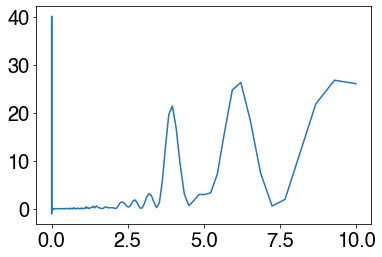

In [45]:
plt.plot(1/(exo_ys2['periodogram'][0]), exo_ys2['periodogram'][1])

9.512842465753424


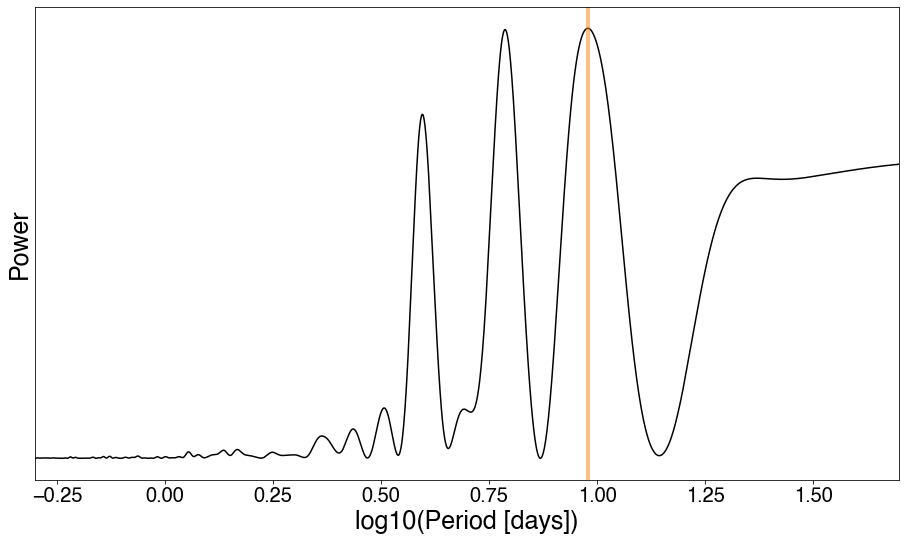

In [46]:
tess_period_ys2_tess = rotate_tess_ys2.ls_rotation()
print(tess_period_ys2_tess)
rotate_tess_ys2.ls_plot();

In [47]:
period_grid_tessys2_tess = np.linspace(.1, 10, 1000)
pdm_period_tessys2_tess, period_err_tessys2_tess = rotate_tess_ys2.pdm_rotation(period_grid_tessys2_tess, pdm_nbins=10)
print(pdm_period_tessys2_tess, period_err_tessys2_tess)

100%|██████████| 1000/1000 [00:10<00:00, 95.04it/s]


fitting to a limited range
9.583783783783785 6.228512857675769


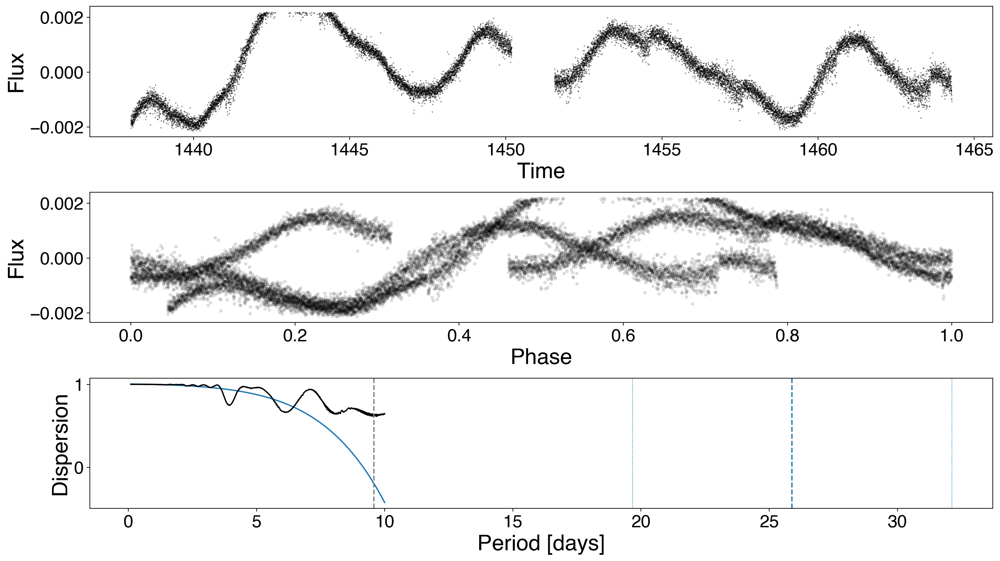

In [48]:
rotate_tess_ys2.pdm_plot();

1.2

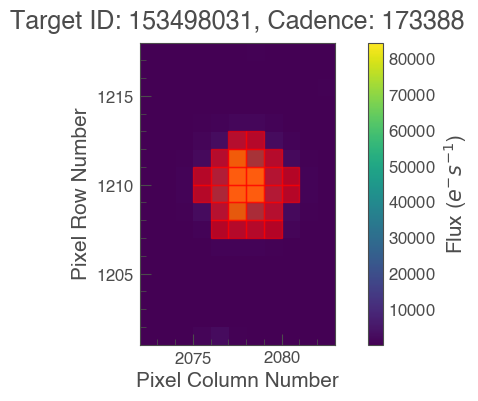

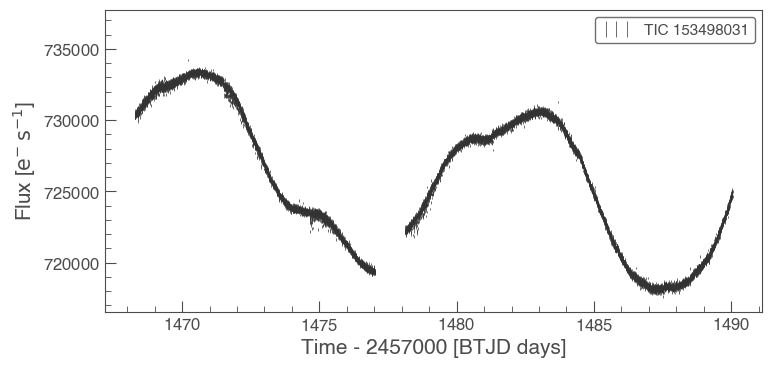

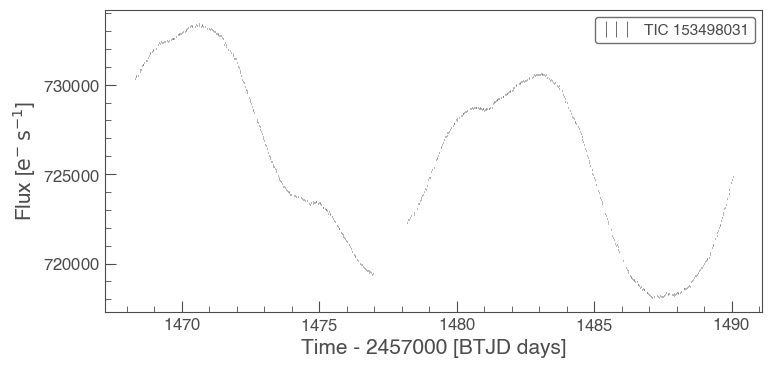

In [49]:
star10 = search_result_two[10].download(quality_bitmask='default')
#star10.interact()
#star10.interact_sky()

target_mask_10 = star10.create_threshold_mask(threshold=15, reference_pixel= 'center')
star10.plot(aperture_mask=target_mask_10, mask_color='r');

lc10 = star10.to_lightcurve(aperture_mask=target_mask_10)
lc10.errorbar()

lc_10 = lc10[(star10.time < 1477) | (star10.time > 1478)]
lc_10.remove_outliers(sigma=3).bin(binsize=20).errorbar();

young_star_names.append(lc_10)
young_stars[two_m_cadence[10]]

In [50]:
ac_10 = ac_mcquillan_set_k(young_star_names[3])
plt.scatter(ac_10[1], ac_10[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 10', fontsize = 25)

TypeError: cannot unpack non-iterable numpy.int64 object

In [51]:
tess_mys3 = (search_result_two[10]).download_all(quality_bitmask='default')
print(tess_mys3[0].targetid)

153498031


In [52]:
tpf_ys3 = tess_mys3[0].to_lightcurve(aperture_mask=tess_mys3[0].pipeline_mask)

In [53]:
flux_nans_ys3 = tpf_ys3.flux[0:]
ys3_time = tpf_ys3.time[0:]
norm_flux_err_ys3 = tpf_ys3.flux_err[0:]
    
flux_mask_ys3 = astat.sigma_clip(flux_nans_ys3, sigma=2, masked = True)
flux_ys3 = flux_nans_ys3[~flux_mask_ys3.mask]
ys3_time = ys3_time[~flux_mask_ys3.mask]
flux_err_ys3 = norm_flux_err_ys3[~flux_mask_ys3.mask]
    
med_ys3 = np.median(flux_ys3)
flux_normalized_ys3 = flux_ys3[0:]/med_ys3 - 1
norm_flux_err_ys3 = flux_err_ys3[0:]/med_ys3

tess_time_ys3_tess = ys3_time
tess_flux_ys3_tess = flux_normalized_ys3
tess_flux_error_ys3_tess = norm_flux_err_ys3

Text(0, 0.5, 'Normalized Flux')

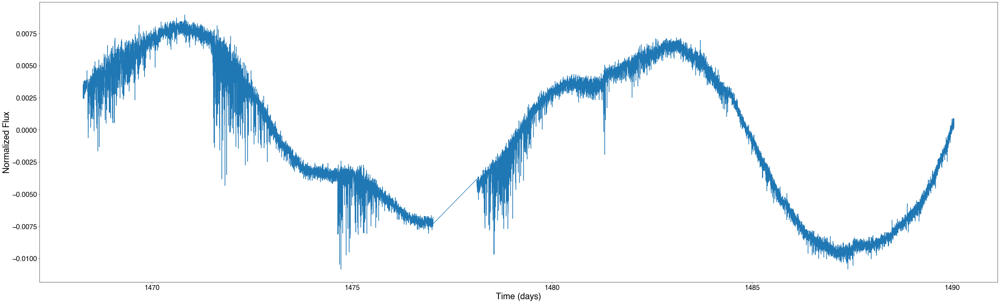

In [54]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_ys3_tess, tess_flux_ys3_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

In [55]:
acf_tess_ys3 = ac_mq_tess("93.3021, 10.6271", 1000);

KeyboardInterrupt: 

In [56]:
plt.figure(figsize=(10,5))
plt.scatter(acf_tess_ys3[1], acf_tess_ys3[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS Autocorrelated 3', fontsize = 25)

NameError: name 'acf_tess_ys3' is not defined

<Figure size 720x360 with 0 Axes>

In [57]:
rotate_tess_ys3 = ss.RotationModel(tess_time_ys3_tess, tess_flux_ys3_tess, tess_flux_error_ys3_tess)

In [58]:
exo_ys3 = exoplanet.lomb_scargle_estimator(tess_time_ys3_tess, tess_flux_ys3_tess, yerr=  tess_flux_error_ys3_tess, max_period= 10, max_peaks=2)

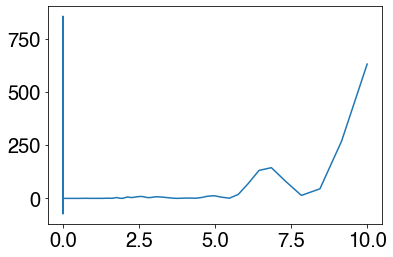

In [59]:
plt.plot(1/(exo_ys3['periodogram'][0]), exo_ys3['periodogram'][1])

11.397767838824832


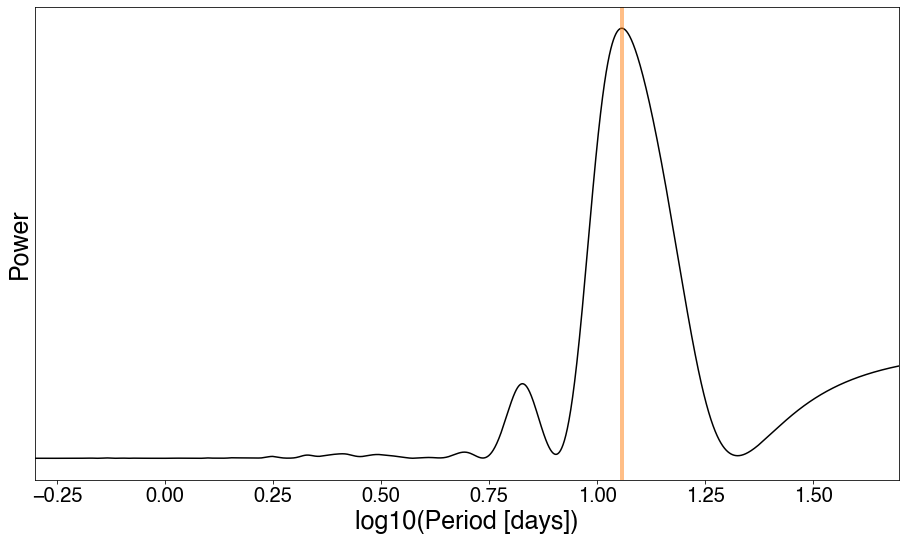

In [60]:
tess_period_ys3_tess = rotate_tess_ys3.ls_rotation()
print(tess_period_ys3_tess)
rotate_tess_ys3.ls_plot();

In [61]:
period_grid_tessys3_tess = np.linspace(.1, 10, 1000)
pdm_period_tessys3_tess, period_err_tessys3_tess = rotate_tess_ys3.pdm_rotation(period_grid_tessys3_tess, pdm_nbins=10)
print(pdm_period_tessys3_tess, period_err_tessys3_tess)

100%|██████████| 1000/1000 [00:09<00:00, 103.73it/s]


10.0 0.7081344719925663


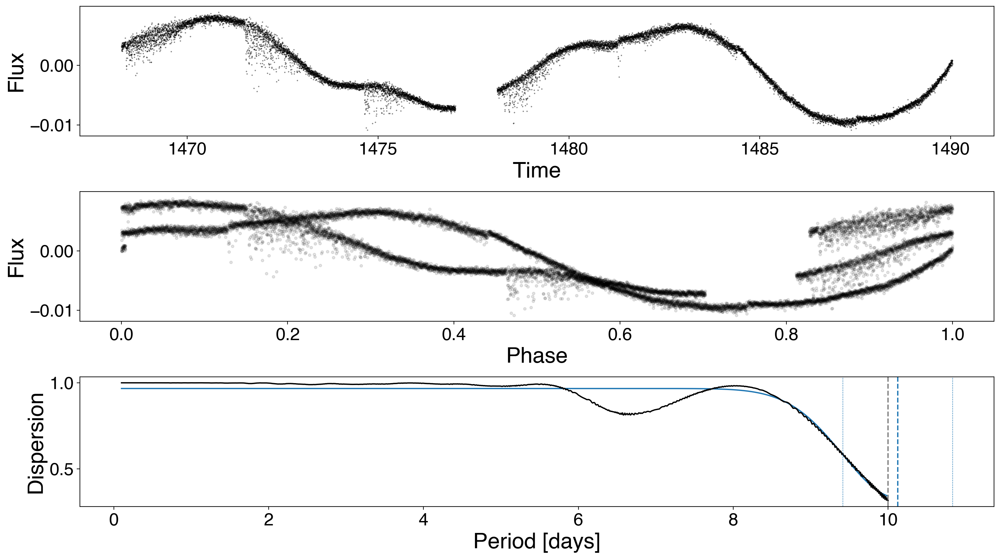

In [62]:
rotate_tess_ys3.pdm_plot();

0.5

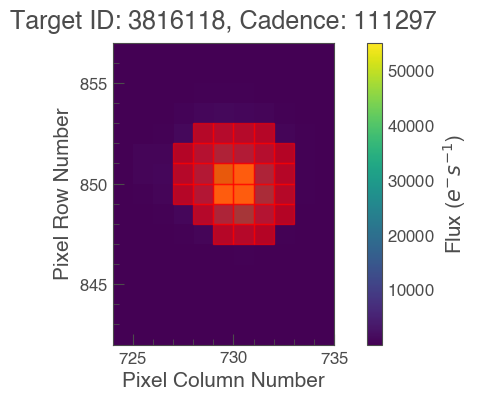

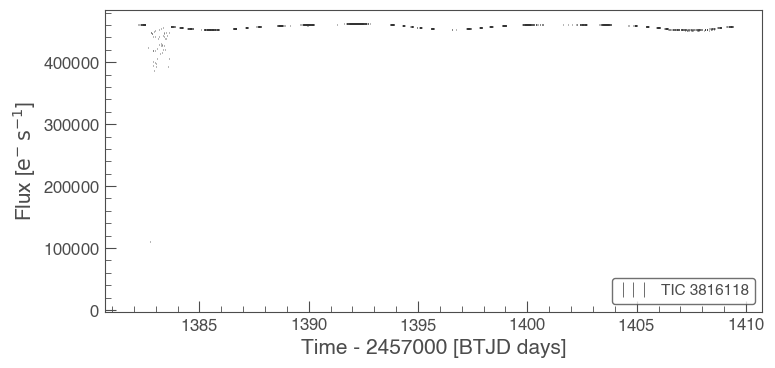

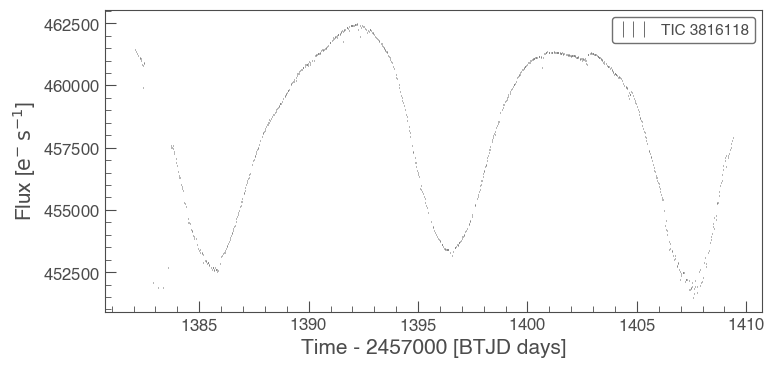

In [63]:
star11 = search_result_two[11].download(quality_bitmask=100)
#star11.interact()
#star11.interact_sky()

target_mask_11 = star11.create_threshold_mask(threshold=15, reference_pixel= 'center')
star11.plot(aperture_mask=target_mask_11, mask_color='r');

lc11 = star11.to_lightcurve(aperture_mask=target_mask_11)
lc11.errorbar()

lc_11 = lc11[(star11.time < 1395) | (star11.time > 1396.5) | (star11.time < 1380) | (star11.time > 1385)]
lc_11.remove_outliers(sigma=3).bin(binsize=20).errorbar();

young_star_names.append(lc_11)
young_stars[two_m_cadence[11]]

In [64]:
ac_11 = ac_mcquillan_set_k(young_star_names[4])
plt.scatter(ac_11[1], ac_11[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 11', fontsize = 25)

TypeError: cannot unpack non-iterable numpy.int64 object

In [ ]:
ac_11 = ac_mcquillan(young_star_names[4], 1000)
plt.scatter(ac_11[1], ac_11[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 11', fontsize = 25)

In [65]:
tess_ys4 = (search_result_two[11]).download_all(quality_bitmask='default')
print(tess_ys4[0].targetid)

3816118


In [66]:
tpf_ys4 = tess_ys4[0].to_lightcurve(aperture_mask=tess_ys4[0].pipeline_mask)

In [67]:
 flux_nans_ys4 = tpf_ys4.flux[0:]
ys4_time = tpf_ys4.time[0:]
norm_flux_err_ys4 = tpf_ys4.flux_err[0:]
    
flux_mask_ys4 = astat.sigma_clip(flux_nans_ys4, sigma=2, masked = True)
flux_ys4 = flux_nans_ys4[~flux_mask_ys4.mask]
ys4_time = ys4_time[~flux_mask_ys4.mask]
flux_err_ys4 = norm_flux_err_ys4[~flux_mask_ys4.mask]
    
med_ys4 = np.median(flux_ys4)
flux_normalized_ys4 = flux_ys4[0:]/med_ys4 - 1
norm_flux_err_ys4 = flux_err_ys4[0:]/med_ys4

tess_time_ys4_tess = ys4_time
tess_flux_ys4_tess = flux_normalized_ys4
tess_flux_error_ys4_tess = norm_flux_err_ys4

Text(0, 0.5, 'Normalized Flux')

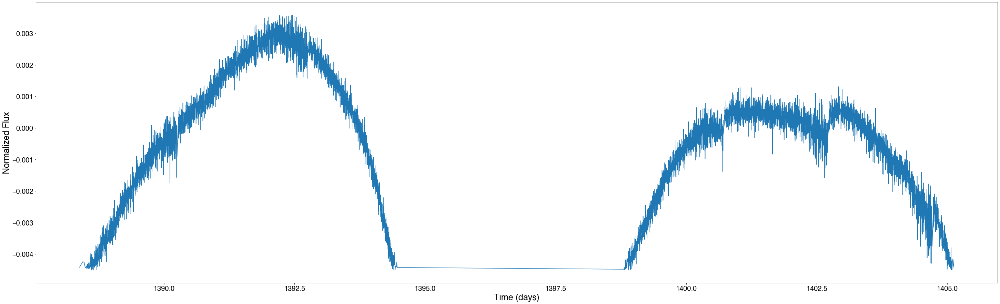

In [68]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_ys4_tess, tess_flux_ys4_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

In [69]:
acf_tess_ys4 = ac_mq_tess("10.1978, -7.2326", 1000);

KeyboardInterrupt: 

In [70]:
plt.figure(figsize=(10,5))
plt.scatter(acf_tess_ys4[1], acf_tess_ys4[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS Autocorrelated 4', fontsize = 25)

NameError: name 'acf_tess_ys4' is not defined

<Figure size 720x360 with 0 Axes>

In [71]:
rotate_tess_ys4 = ss.RotationModel(tess_time_ys4_tess, tess_flux_ys4_tess, tess_flux_error_ys4_tess)

In [72]:
exo_ys4 = exoplanet.lomb_scargle_estimator(tess_time_ys4_tess, tess_flux_ys4_tess, yerr=  tess_flux_error_ys4_tess, max_period= 10, max_peaks=2)

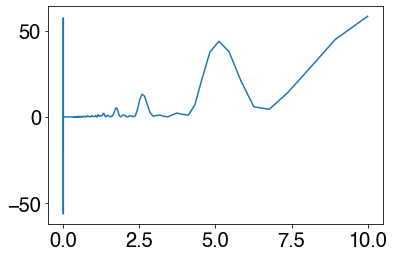

In [73]:
plt.plot(1/(exo_ys4['periodogram'][0]), exo_ys4['periodogram'][1])

10.018574623097454


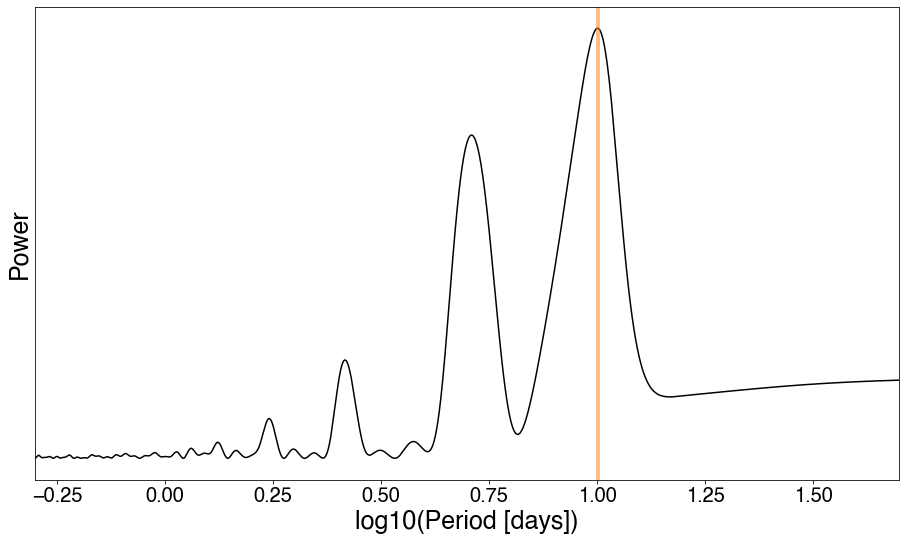

In [74]:
tess_period_ys4_tess = rotate_tess_ys4.ls_rotation()
print(tess_period_ys4_tess)
rotate_tess_ys4.ls_plot();

In [75]:
period_grid_tessys4_tess = np.linspace(.1, 10, 1000)
pdm_period_tessys4_tess, period_err_tessys4_tess = rotate_tess_ys4.pdm_rotation(period_grid_tessys4_tess, pdm_nbins=10)
print(pdm_period_tessys4_tess, period_err_tessys4_tess)

 87%|████████▋ | 869/1000 [00:05<00:00, 153.83it/s]/Users/ilanadoran/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
100%|██████████| 1000/1000 [00:06<00:00, 147.96it/s]

8.86036036036036 0.8860360360360361


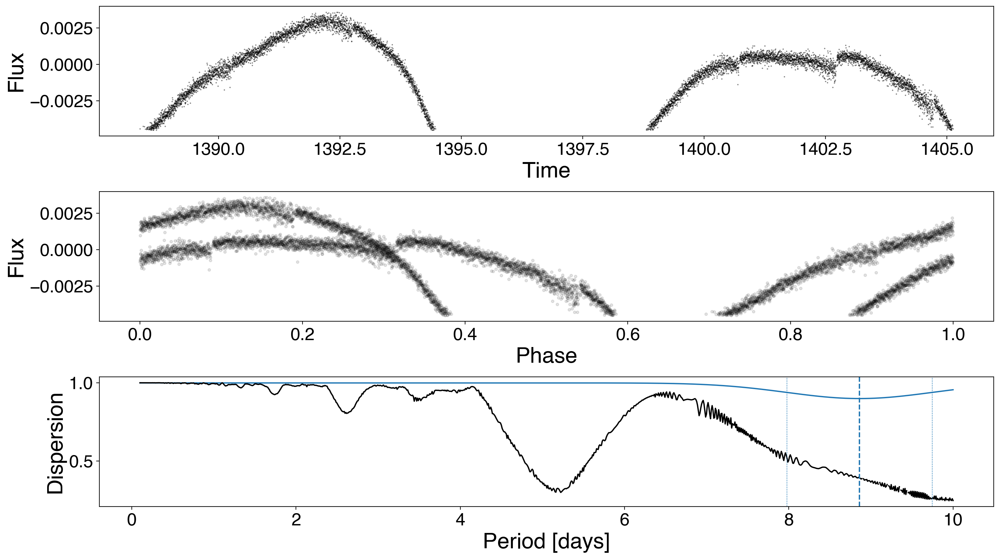

In [76]:
rotate_tess_ys4.pdm_plot();

1.2

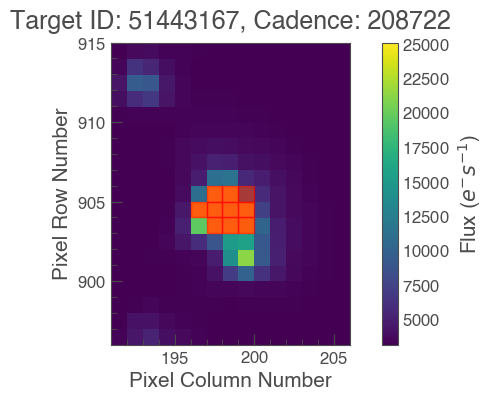

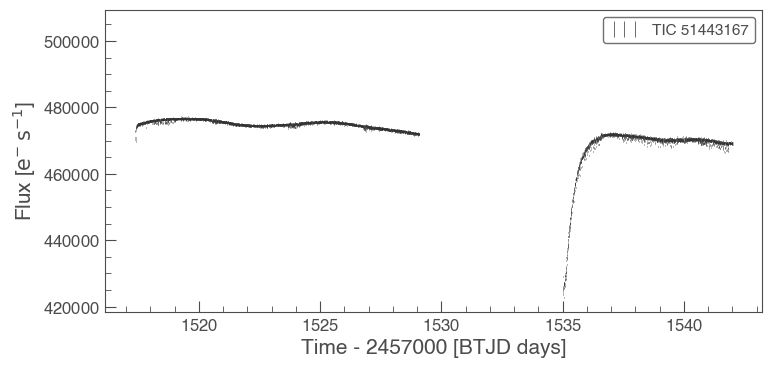

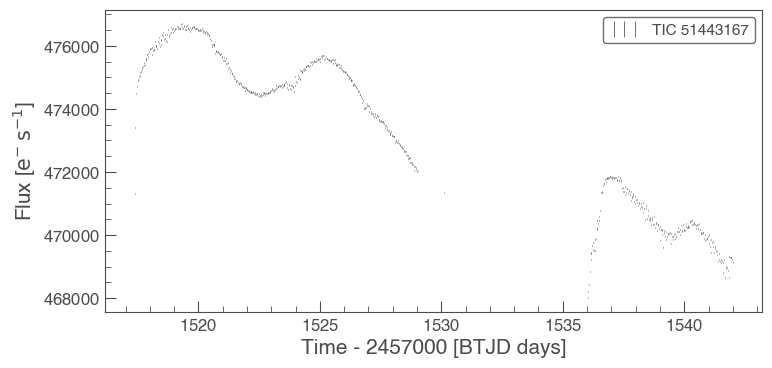

In [77]:
star14 = search_result_two[14].download(quality_bitmask='default')
#star14.interact()
#star14.interact_sky()

target_mask_14 = star14.create_threshold_mask(threshold=90, reference_pixel= 'center')
star14.plot(aperture_mask=target_mask_14, mask_color='r');

lc14 = star14.to_lightcurve(aperture_mask=target_mask_14)
lc14.errorbar()

lc_14 = lc14[(star14.time < 1530) | (star14.time > 1536)]
lc_14.remove_outliers(sigma=3).bin(binsize=20).errorbar();

young_star_names.append(lc_14)
young_stars[two_m_cadence[14]]

In [ ]:
ac_14 = ac_mcquillan_set_k(young_star_names[5])
plt.scatter(ac_14[1], ac_14[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 14', fontsize = 25)

In [78]:
tess_ys14 = (search_result_two[14]).download_all(quality_bitmask='default')
print(tess_ys14[0].targetid)

51443167


In [79]:
tpf_ys14 = tess_ys14[0].to_lightcurve(aperture_mask=tess_ys14[0].pipeline_mask)

In [80]:
flux_nans_ys14 = tpf_ys14.flux[0:]
ys14_time = tpf_ys14.time[0:]
norm_flux_err_ys14 = tpf_ys14.flux_err[0:]
    
flux_mask_ys14 = astat.sigma_clip(flux_nans_ys14, sigma=2, masked = True)
flux_ys14 = flux_nans_ys14[~flux_mask_ys14.mask]
ys14_time = ys14_time[~flux_mask_ys14.mask]
flux_err_ys14 = norm_flux_err_ys14[~flux_mask_ys14.mask]
    
med_ys14 = np.median(flux_ys14)
flux_normalized_ys14 = flux_ys14[0:]/med_ys14 - 1
norm_flux_err_ys14 = flux_err_ys14[0:]/med_ys14

tess_time_ys14_tess = ys14_time
tess_flux_ys14_tess = flux_normalized_ys14
tess_flux_error_ys14_tess = norm_flux_err_ys14

Text(0, 0.5, 'Normalized Flux')

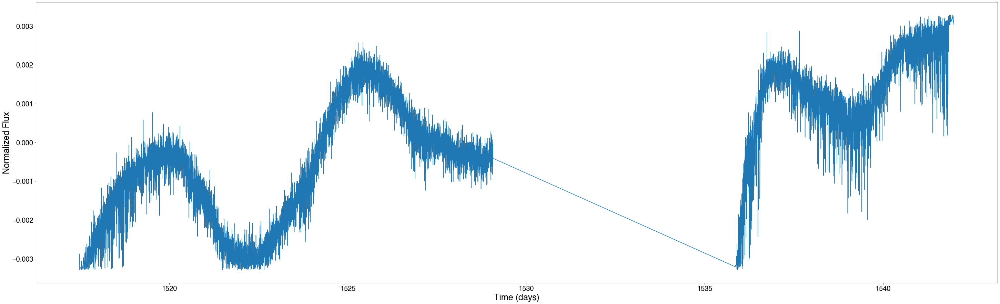

In [81]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_ys14_tess, tess_flux_ys14_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

In [82]:
acf_tess_ys14 = ac_mq_tess("129.4596, -6.8069", 1000);

KeyboardInterrupt: 

In [83]:
plt.figure(figsize=(10,5))
plt.scatter(acf_tess_ys14[1], acf_tess_ys14[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS Autocorrelated 14', fontsize = 25)

NameError: name 'acf_tess_ys14' is not defined

<Figure size 720x360 with 0 Axes>

In [84]:
rotate_tess_ys14 = ss.RotationModel(tess_time_ys14_tess, tess_flux_ys14_tess, tess_flux_error_ys14_tess)

In [85]:
exo_ys14 = exoplanet.lomb_scargle_estimator(tess_time_ys14_tess, tess_flux_ys14_tess, yerr=  tess_flux_error_ys14_tess, max_period= 10, max_peaks=2)

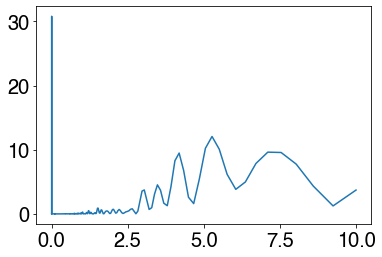

In [86]:
plt.plot(1/(exo_ys14['periodogram'][0]), exo_ys14['periodogram'][1])

12.811613587620782


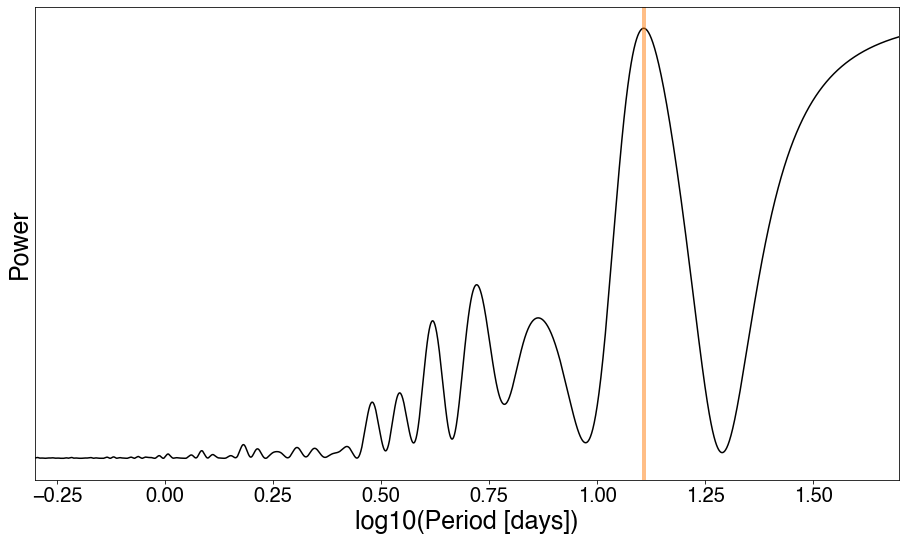

In [87]:
tess_period_ys14_tess = rotate_tess_ys14.ls_rotation()
print(tess_period_ys14_tess)
rotate_tess_ys14.ls_plot();

In [88]:
period_grid_tessys14_tess = np.linspace(.1, 10, 1000)
pdm_period_tessys14_tess, period_err_tessys14_tess = rotate_tess_ys14.pdm_rotation(period_grid_tessys14_tess, pdm_nbins=10)
print(pdm_period_tessys14_tess, period_err_tessys14_tess)

100%|██████████| 1000/1000 [00:09<00:00, 106.25it/s]

10.0 2.9796287731215427


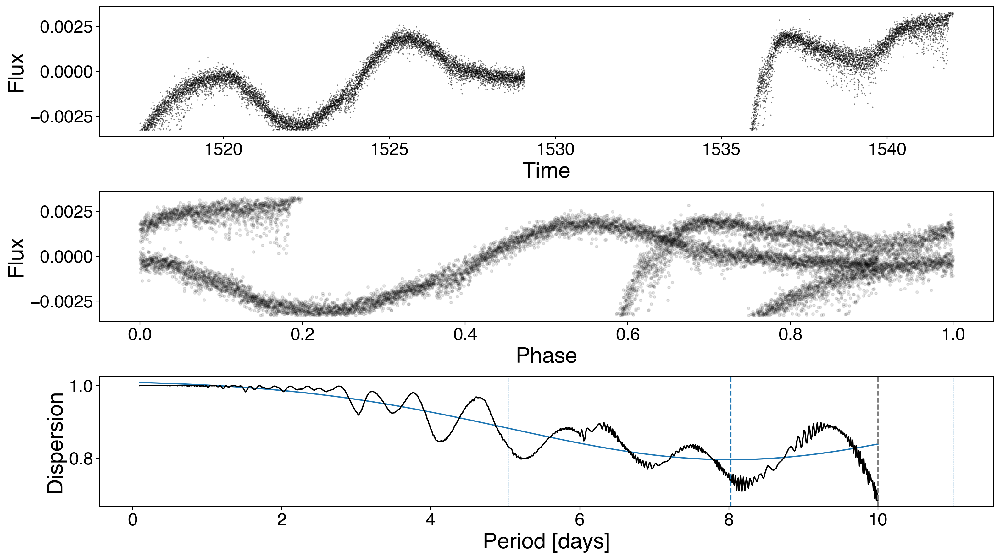

In [89]:
rotate_tess_ys14.pdm_plot();

1.9

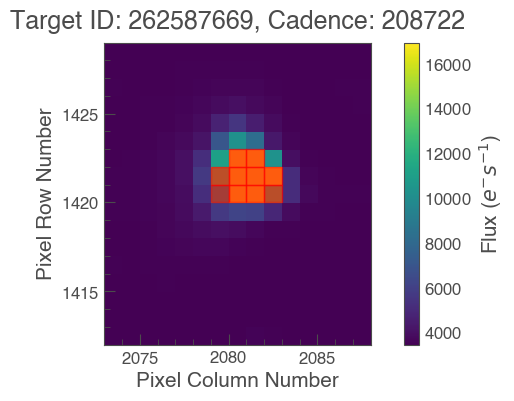

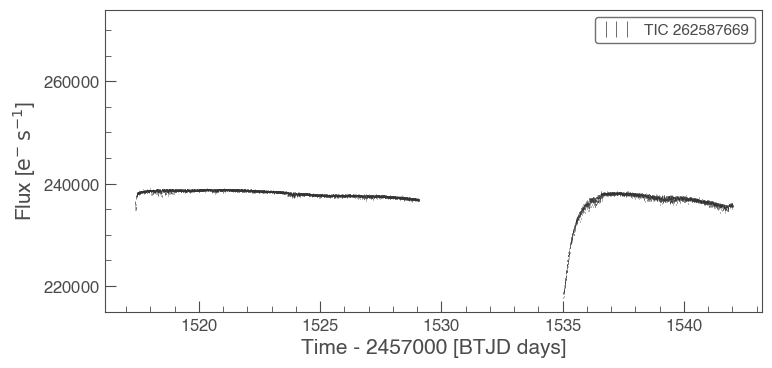

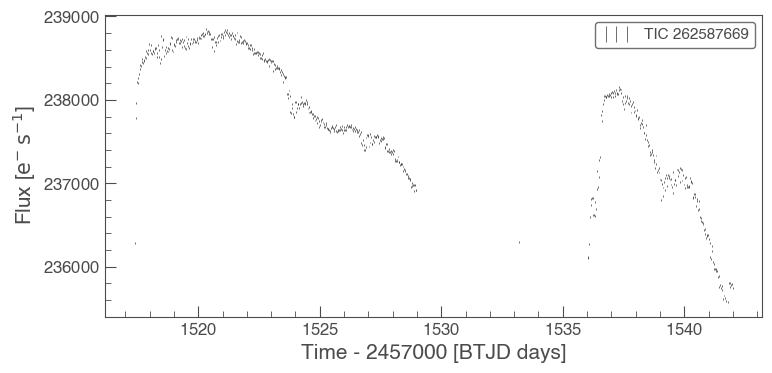

In [90]:
star15 = search_result_two[15].download(quality_bitmask='default')
#star15.interact()
#star15.interact_sky()

target_mask_15 = star15.create_threshold_mask(threshold=250, reference_pixel= 'center')
star15.plot(aperture_mask=target_mask_15, mask_color='r');

lc15 = star15.to_lightcurve(aperture_mask=target_mask_15)
lc15.errorbar()

lc_15 = lc15[(star15.time < 1529) | (star15.time > 1536)]
lc_15.remove_outliers(sigma=3).bin(binsize=20).errorbar();

young_star_names.append(lc_15)
young_stars[two_m_cadence[15]]

In [91]:
ac_15 = ac_mcquillan_set_k(young_star_names[6])
plt.scatter(ac_15[1], ac_15[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 15', fontsize = 25)

TypeError: cannot unpack non-iterable numpy.int64 object

In [92]:
tess_ys15 = (search_result_two[3]).download_all(quality_bitmask='default')
print(tess_ys15[0].targetid)

139112038


In [93]:
tpf_ys15 = tess_ys15[0].to_lightcurve(aperture_mask=tess_ys15[0].pipeline_mask)

In [94]:
flux_nans_ys15 = tpf_ys15.flux[0:]
ys15_time = tpf_ys15.time[0:]
norm_flux_err_ys15 = tpf_ys15.flux_err[0:]
    
flux_mask_ys15 = astat.sigma_clip(flux_nans_ys15, sigma=2, masked = True)
flux_ys15 = flux_nans_ys15[~flux_mask_ys15.mask]
ys15_time = ys15_time[~flux_mask_ys15.mask]
flux_err_ys15 = norm_flux_err_ys15[~flux_mask_ys15.mask]
    
med_ys15 = np.median(flux_ys15)
flux_normalized_ys15 = flux_ys15[0:]/med_ys15 - 1
norm_flux_err_ys15 = flux_err_ys15[0:]/med_ys15

tess_time_ys15_tess = ys15_time
tess_flux_ys15_tess = flux_normalized_ys15
tess_flux_error_ys15_tess = norm_flux_err_ys15

Text(0, 0.5, 'Normalized Flux')

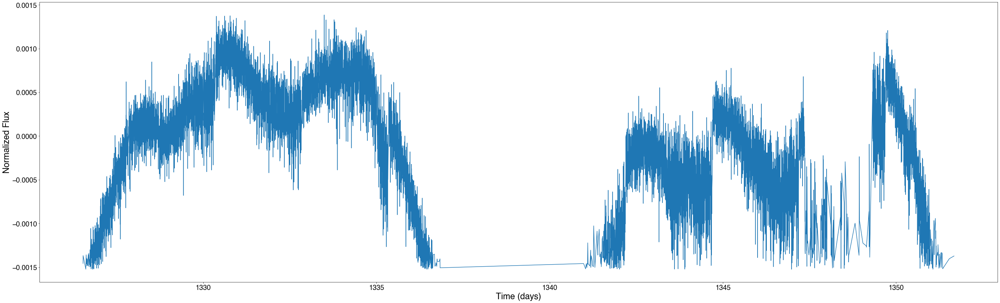

In [95]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_ys15_tess, tess_flux_ys15_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

In [ ]:
acf_tess_ys15 = ac_mq_tess("319.6136, -43.3347", 1000);

In [96]:
plt.figure(figsize=(10,5))
plt.scatter(acf_tess_ys15[1], acf_tess_ys15[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS Autocorrelated 15', fontsize = 25)

NameError: name 'acf_tess_ys15' is not defined

<Figure size 720x360 with 0 Axes>

In [97]:
rotate_tess_ys15 = ss.RotationModel(tess_time_ys15_tess, tess_flux_ys15_tess, tess_flux_error_ys15_tess)

In [98]:
exo_ys15 = exoplanet.lomb_scargle_estimator(tess_time_ys15_tess, tess_flux_ys15_tess, yerr=  tess_flux_error_ys15_tess, max_period= 10, max_peaks=2)

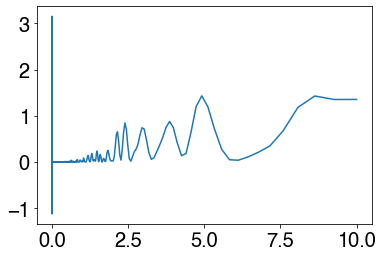

In [99]:
plt.plot(1/(exo_ys15['periodogram'][0]), exo_ys15['periodogram'][1])

16.328180108158946


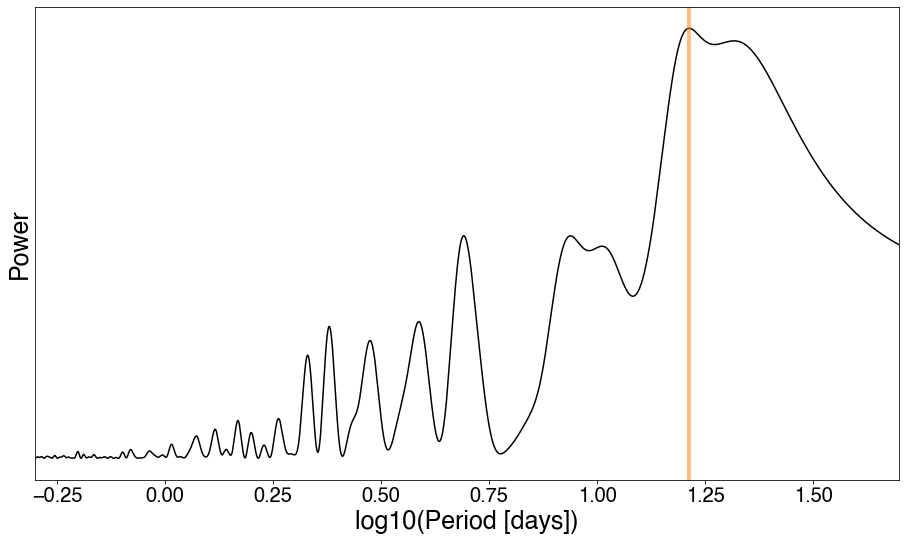

In [100]:
tess_period_ys15_tess = rotate_tess_ys15.ls_rotation()
print(tess_period_ys15_tess)
rotate_tess_ys15.ls_plot();

In [101]:
period_grid_tessys15_tess = np.linspace(.1, 10, 1000)
pdm_period_tessys15_tess, period_err_tessys15_tess = rotate_tess_ys15.pdm_rotation(period_grid_tessys15_tess, pdm_nbins=10)
print(pdm_period_tessys15_tess, period_err_tessys15_tess)

100%|██████████| 1000/1000 [00:09<00:00, 100.21it/s]


fitting to a limited range
9.633333333333335 1.3108355080409615


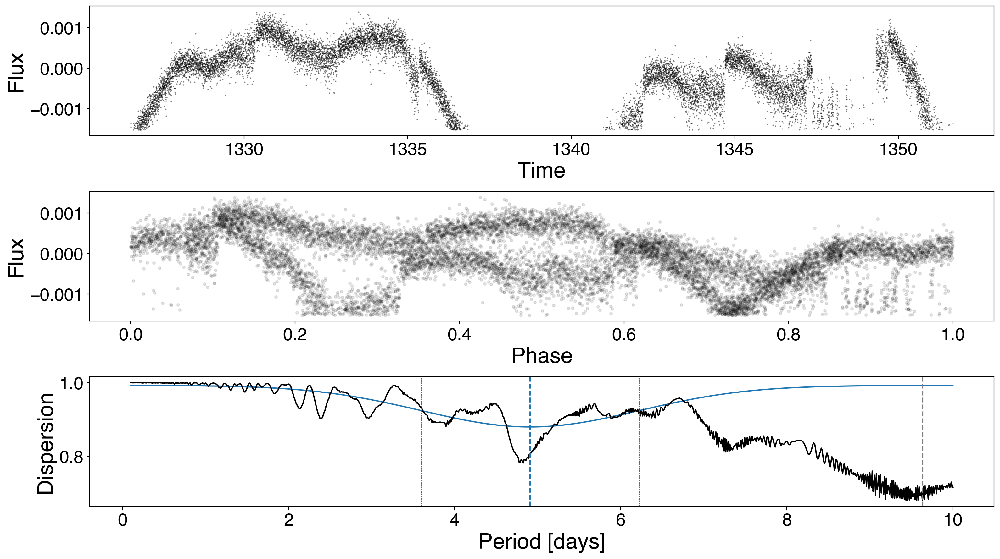

In [102]:
rotate_tess_ys15.pdm_plot();

0.7

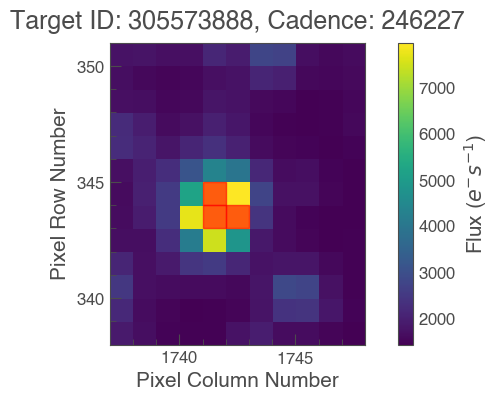

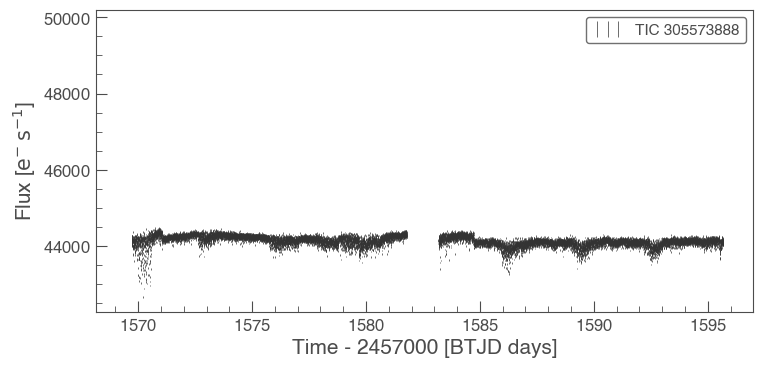

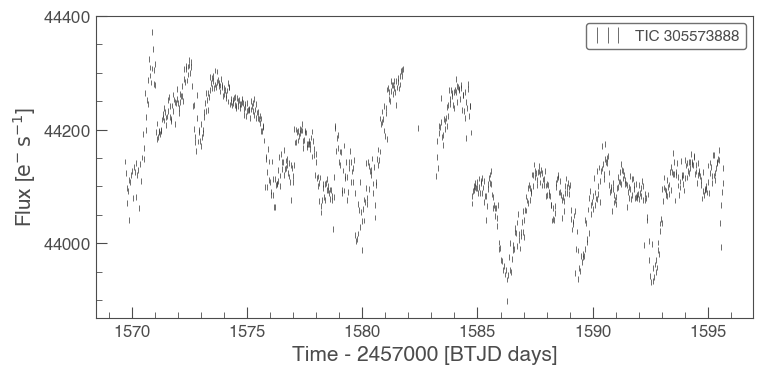

In [103]:
star18 = search_result_two[18].download(quality_bitmask='default')
#star18.interact()
#star18.interact_sky()

target_mask_18 = star18.create_threshold_mask(threshold=30, reference_pixel= 'center')
star18.plot(aperture_mask=target_mask_18, mask_color='r');

lc_18 = star18.to_lightcurve(aperture_mask=target_mask_18)
lc_18.errorbar()

lc_18.remove_outliers(sigma=3).bin(binsize=20).errorbar();

young_star_names.append(lc_18)
young_stars[two_m_cadence[18]]

In [ ]:
ac_18 = ac_mcquillan_set_k(young_star_names[7])
plt.scatter(ac_18[1], ac_18[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 18', fontsize = 25)

In [ ]:
ac_18 = ac_mcquillan(young_star_names[7], 1000)
plt.scatter(ac_18[1], ac_18[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 18', fontsize = 25)

In [ ]:
ac_18 = ac_mcquillan(young_star_names[7], 100)
plt.scatter(ac_18[1], ac_18[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 18', fontsize = 25)

plt.ylim(-0.05, 0.05)

In [104]:
tess_ys18 = (search_result_two[18]).download_all(quality_bitmask='default')
print(tess_ys18[0].targetid)

305573888


In [105]:
tpf_ys18 = tess_ys18[0].to_lightcurve(aperture_mask=tess_ys18[0].pipeline_mask)

In [106]:
flux_nans_ys18 = tpf_ys18.flux[0:]
ys18_time = tpf_ys18.time[0:]
norm_flux_err_ys18 = tpf_ys18.flux_err[0:]
    
flux_mask_ys18 = astat.sigma_clip(flux_nans_ys18, sigma=2, masked = True)
flux_ys18 = flux_nans_ys18[~flux_mask_ys18.mask]
ys18_time = ys18_time[~flux_mask_ys18.mask]
flux_err_ys18 = norm_flux_err_ys18[~flux_mask_ys18.mask]
    
med_ys18 = np.median(flux_ys18)
flux_normalized_ys18 = flux_ys18[0:]/med_ys18 - 1
norm_flux_err_ys18 = flux_err_ys18[0:]/med_ys18

tess_time_ys18_tess = ys18_time
tess_flux_ys18_tess = flux_normalized_ys18
tess_flux_error_ys18_tess = norm_flux_err_ys18

Text(0, 0.5, 'Normalized Flux')

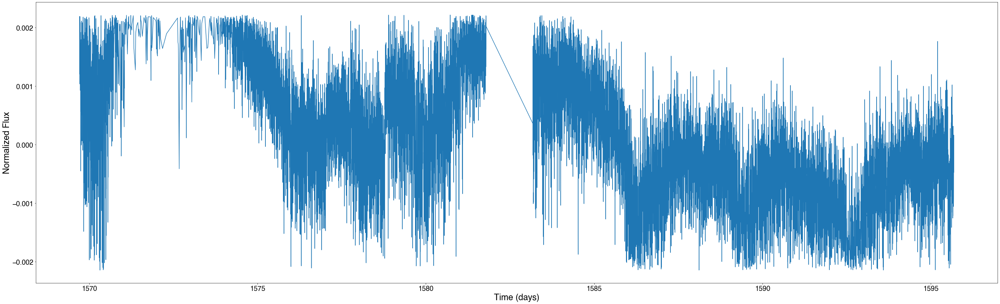

In [107]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_ys18_tess, tess_flux_ys18_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

In [ ]:
acf_tess_ys18 = ac_mq_tess("166.0569, -57.7651", 1000);

plt.figure(figsize=(10,5))
plt.scatter(acf_tess_ys18[1], acf_tess_ys18[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS Autocorrelated 18', fontsize = 25)

In [108]:
rotate_tess_ys18 = ss.RotationModel(tess_time_ys18_tess, tess_flux_ys18_tess, tess_flux_error_ys18_tess)

In [109]:
exo_ys18 = exoplanet.lomb_scargle_estimator(tess_time_ys18_tess, tess_flux_ys18_tess, yerr=  tess_flux_error_ys18_tess, max_period= 10, max_peaks=2)

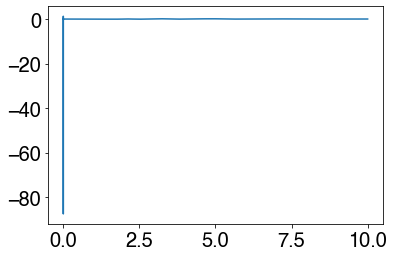

In [110]:
plt.plot(1/(exo_ys18['periodogram'][0]), exo_ys18['periodogram'][1])

47.37358233137205


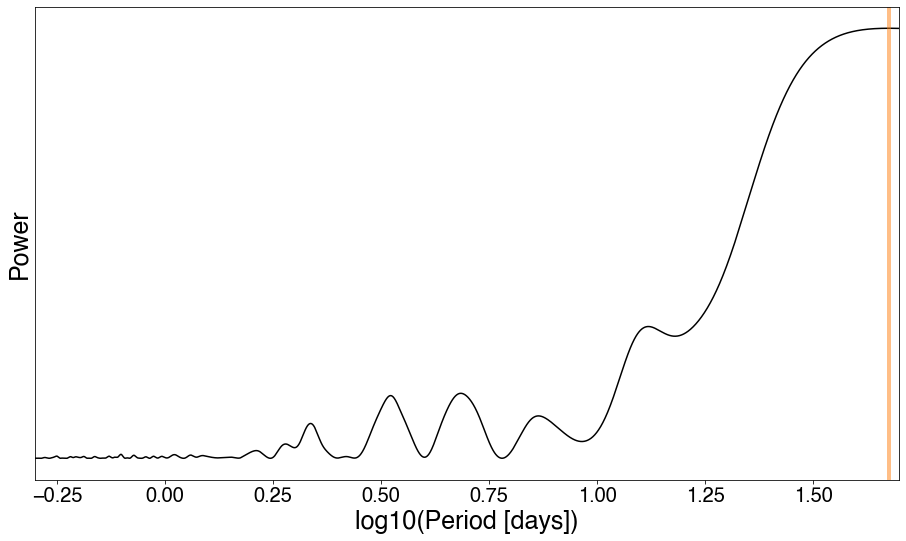

In [111]:
tess_period_ys18_tess = rotate_tess_ys18.ls_rotation()
print(tess_period_ys18_tess)
rotate_tess_ys18.ls_plot();

In [112]:
period_grid_tessys18_tess = np.linspace(.1, 10, 1000)
pdm_period_tessys18_tess, period_err_tessys18_tess = rotate_tess_ys18.pdm_rotation(period_grid_tessys18_tess, pdm_nbins=10)
print(pdm_period_tessys18_tess, period_err_tessys18_tess)

100%|██████████| 1000/1000 [00:11<00:00, 83.65it/s]


fitting to a limited range
9.98018018018018 6.017160788837047


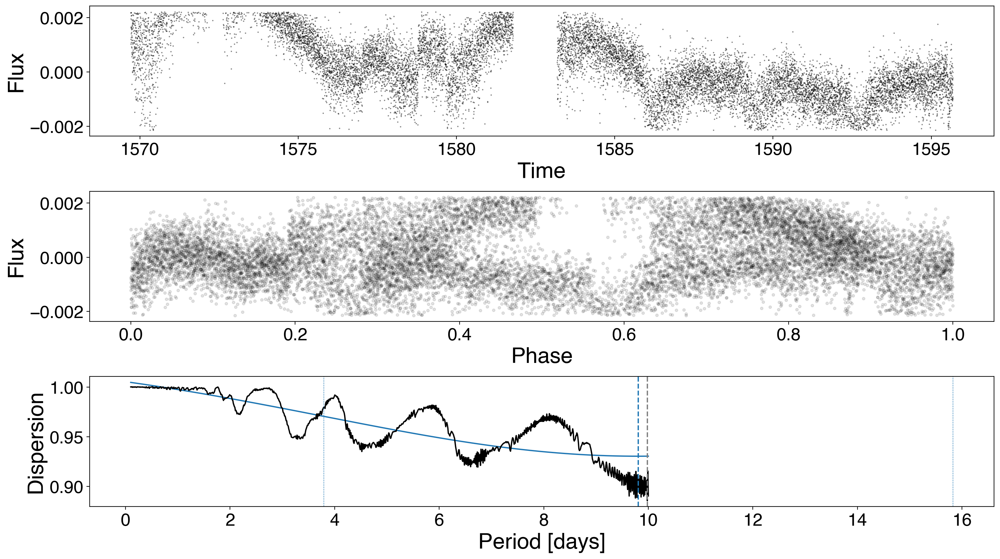

In [113]:
rotate_tess_ys18.pdm_plot();

0.7

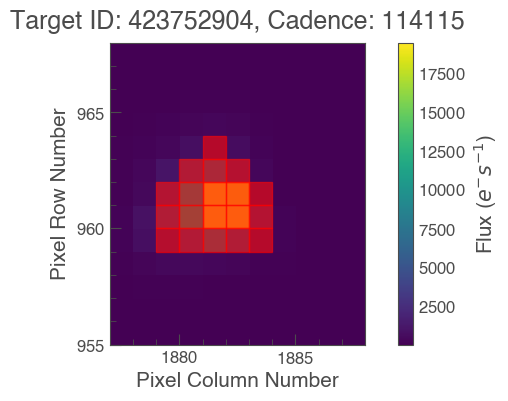

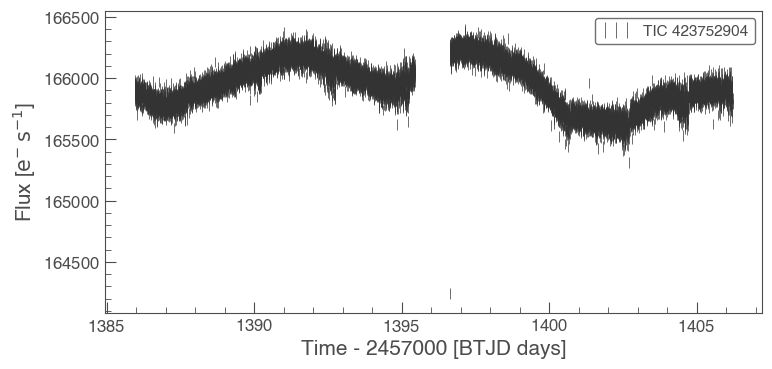

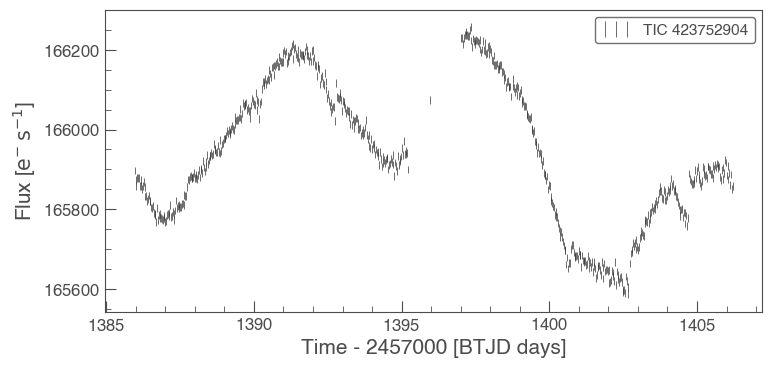

In [114]:
star31 = search_result_two[31].download(quality_bitmask= 'default')
#star31.interact()
#star31.interact_sky()

target_mask_31 = star31.create_threshold_mask(threshold=15, reference_pixel='center')
star31.plot(aperture_mask=target_mask_31, mask_color='r');

lc31 = star31.to_lightcurve(aperture_mask=target_mask_31)
lc31.errorbar()

lc_31 = lc31[(star31.time < 1395.25) | (star31.time > 1397)]
lc_31.remove_outliers(sigma=3).bin(binsize=20).errorbar();

young_star_names.append(lc_31)
young_stars[two_m_cadence[31]]

In [ ]:
ac_31 = ac_mcquillan_set_k(young_star_names[8])
plt.scatter(ac_31[1], ac_31[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 31', fontsize = 25)

In [115]:
tess_ys31 = (search_result_two[31]).download_all(quality_bitmask='default')
print(tess_ys31[0].targetid)

423752904


In [116]:
tpf_ys31 = tess_ys31[0].to_lightcurve(aperture_mask=tess_ys31[0].pipeline_mask)

In [117]:
flux_nans_ys31 = tpf_ys31.flux[0:]
ys31_time = tpf_ys31.time[0:]
norm_flux_err_ys31 = tpf_ys31.flux_err[0:]
    
flux_mask_ys31 = astat.sigma_clip(flux_nans_ys31, sigma=2, masked = True)
flux_ys31 = flux_nans_ys31[~flux_mask_ys31.mask]
ys31_time = ys31_time[~flux_mask_ys31.mask]
flux_err_ys31 = norm_flux_err_ys31[~flux_mask_ys31.mask]
    
med_ys31 = np.median(flux_ys31)
flux_normalized_ys31 = flux_ys31[0:]/med_ys31 - 1
norm_flux_err_ys31 = flux_err_ys31[0:]/med_ys31

tess_time_ys31_tess = ys31_time
tess_flux_ys31_tess = flux_normalized_ys31
tess_flux_error_ys31_tess = norm_flux_err_ys31

Text(0, 0.5, 'Normalized Flux')

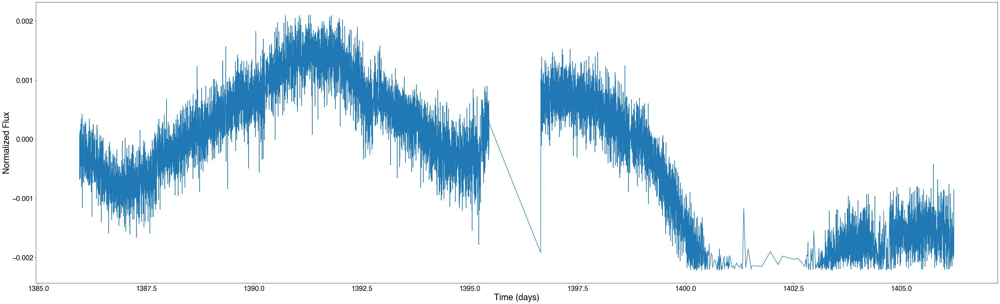

In [118]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_ys31_tess, tess_flux_ys31_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

In [23]:
acf_tess_ys31 = ac_mq_tess("30.0222, -13.5461", 1000);

plt.figure(figsize=(10,5))
plt.scatter(acf_tess_ys31[1], acf_tess_ys31[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS Autocorrelated Figure 5c', fontsize = 25)

KeyboardInterrupt: 

In [119]:
rotate_tess_ys31 = ss.RotationModel(tess_time_ys31_tess, tess_flux_ys31_tess, tess_flux_error_ys31_tess)

In [120]:
exo_ys31 = exoplanet.lomb_scargle_estimator(tess_time_ys31_tess, tess_flux_ys31_tess, yerr=  tess_flux_error_ys31_tess, max_period= 10, max_peaks=2)

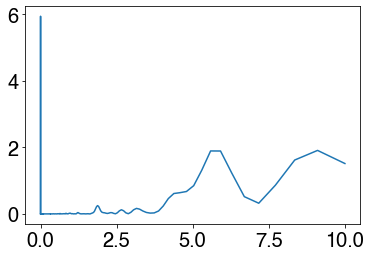

In [121]:
plt.plot(1/(exo_ys31['periodogram'][0]), exo_ys31['periodogram'][1])

24.048742478680577


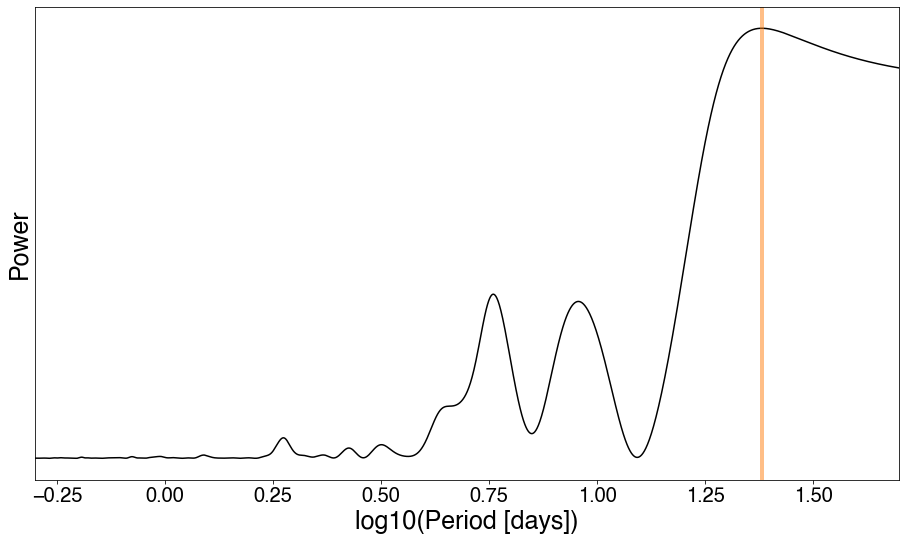

In [122]:
tess_period_ys31_tess = rotate_tess_ys31.ls_rotation()
print(tess_period_ys31_tess)
rotate_tess_ys31.ls_plot();

In [123]:
period_grid_tessys31_tess = np.linspace(.1, 10, 1000)
pdm_period_tessys31_tess, period_err_tessys31_tess = rotate_tess_ys31.pdm_rotation(period_grid_tessys31_tess, pdm_nbins=10)
print(pdm_period_tessys31_tess, period_err_tessys31_tess)

100%|██████████| 1000/1000 [00:08<00:00, 116.13it/s]


fitting to a limited range
9.514414414414414 0.611479114444029


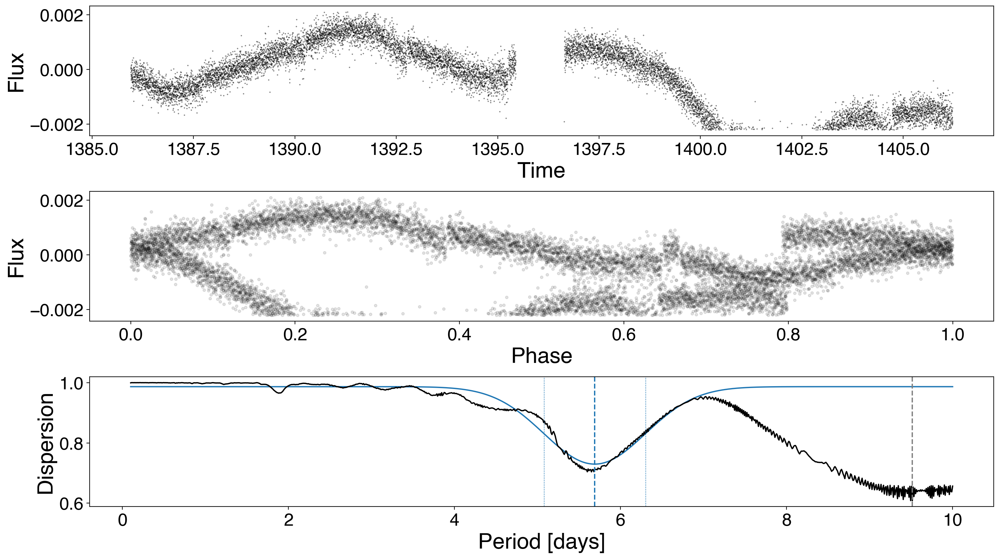

In [124]:
rotate_tess_ys31.pdm_plot();

0.5

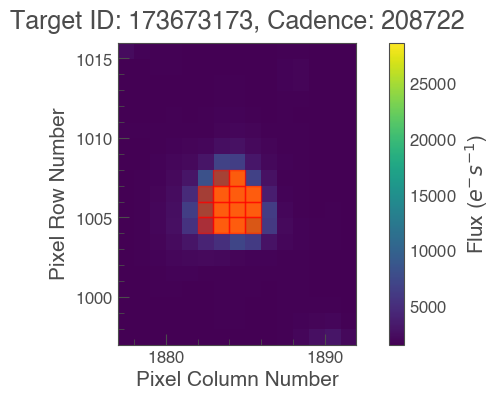

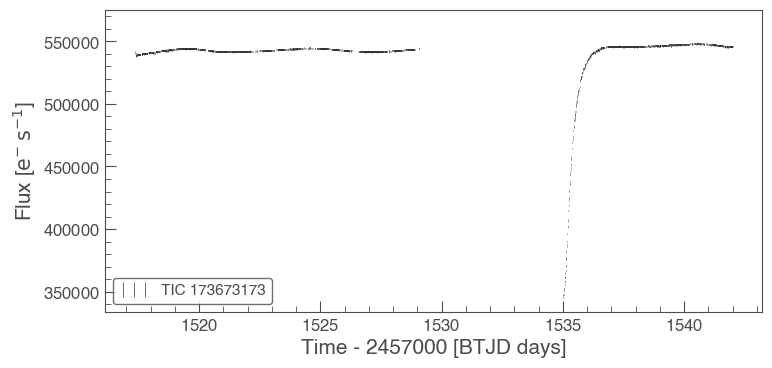

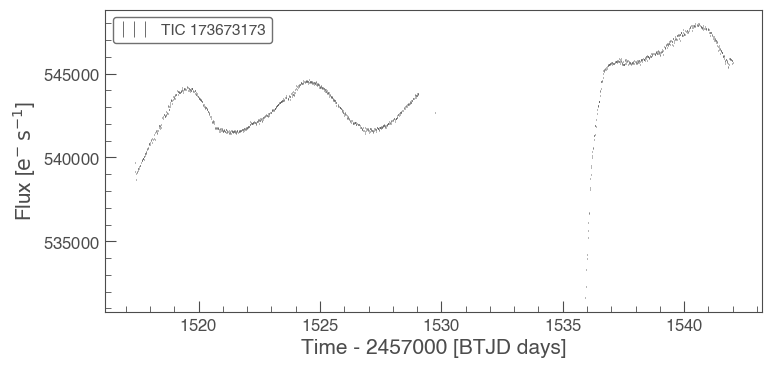

In [125]:
star_th_5 = search_result_thirty[5].download_all(quality_bitmask='default')
#star_th_5.interact()
#star_th_5.interact_sky()

target_mask__th_5 = star_th_5[1].create_threshold_mask(threshold=100, reference_pixel='center')
star_th_5[1].plot(aperture_mask=target_mask__th_5, mask_color='r');

lc_th_5 = star_th_5[1].to_lightcurve(aperture_mask=target_mask__th_5)
lc_th_5.errorbar()

lc__th_5 = lc_th_5[(star_th_5[1].time < 1503) | (star_th_5[1].time > 1504)]
lc__th_5.remove_outliers(sigma=5).bin(binsize=10).errorbar();

young_star_names.append(lc__th_5)
young_stars[thirty_m_cadence[5]]

In [ ]:
ac_th_5 = ac_mcquillan_set_k(young_star_names[9])
plt.scatter(ac_th_5[1], ac_th_5[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 5 (30m cadence)', fontsize = 25)

In [126]:
tess_ys6 = (search_result_thirty[5]).download_all(quality_bitmask='default')
print(tess_ys6[0].targetid)

173673173


In [127]:
tpf_ys6 = tess_ys6[0].to_lightcurve(aperture_mask=tess_ys6[0].pipeline_mask)

In [128]:
flux_nans_ys6 = tpf_ys6.flux[0:]
ys6_time = tpf_ys6.time[0:]
norm_flux_err_ys6 = tpf_ys6.flux_err[0:]
    
flux_mask_ys6 = astat.sigma_clip(flux_nans_ys6, sigma=2, masked = True)
flux_ys6 = flux_nans_ys6[~flux_mask_ys6.mask]
ys6_time = ys6_time[~flux_mask_ys6.mask]
flux_err_ys6 = norm_flux_err_ys6[~flux_mask_ys6.mask]
    
med_ys6 = np.median(flux_ys6)
flux_normalized_ys6 = flux_ys6[0:]/med_ys6 - 1
norm_flux_err_ys6 = flux_err_ys6[0:]/med_ys6

tess_time_ys6_tess = ys6_time
tess_flux_ys6_tess = flux_normalized_ys6
tess_flux_error_ys6_tess = norm_flux_err_ys6

Text(0, 0.5, 'Normalized Flux')

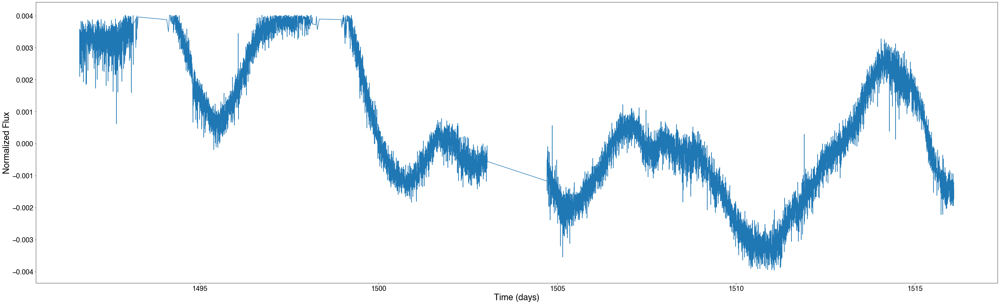

In [129]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_ys6_tess, tess_flux_ys6_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

In [ ]:
acf_tess_ys6 = ac_mq_tess("112.6771, -37.3394", 1000);

plt.figure(figsize=(10,5))
plt.scatter(acf_tess_ys6[1], acf_tess_ys6[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS Autocorrelated Figure 5c', fontsize = 25)

In [130]:
rotate_tess_ys6 = ss.RotationModel(tess_time_ys6_tess, tess_flux_ys6_tess, tess_flux_error_ys6_tess)

In [131]:
exo_ys6 = exoplanet.lomb_scargle_estimator(tess_time_ys6_tess, tess_flux_ys6_tess, yerr=  tess_flux_error_ys6_tess, max_period= 10, max_peaks=2)

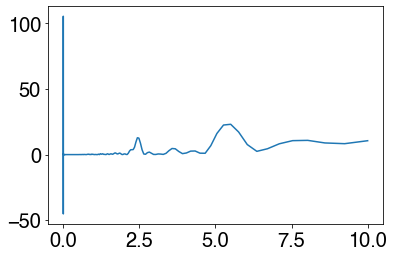

In [132]:
plt.plot(1/(exo_ys6['periodogram'][0]), exo_ys6['periodogram'][1])

31.842150512982176


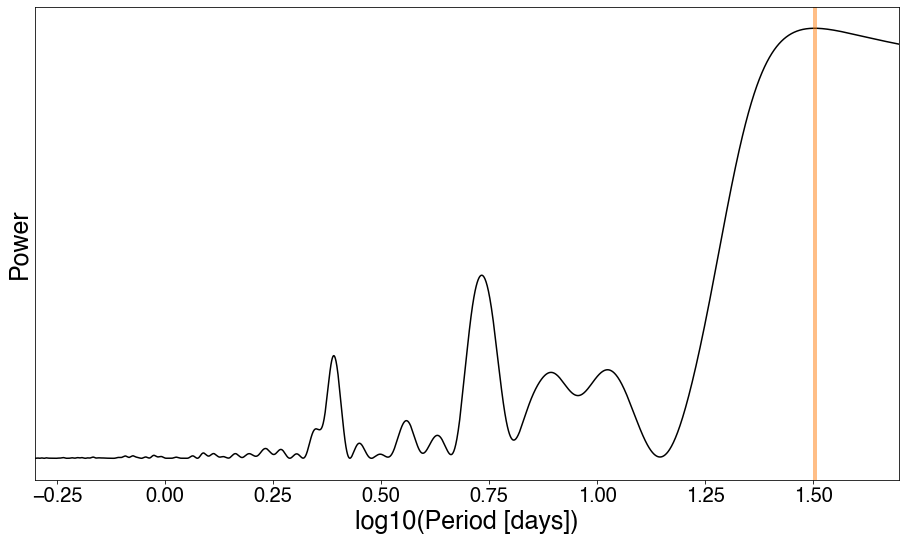

In [133]:
tess_period_ys6_tess = rotate_tess_ys6.ls_rotation()
print(tess_period_ys6_tess)
rotate_tess_ys6.ls_plot();

In [134]:
period_grid_tessys6_tess = np.linspace(.1, 10, 1000)
pdm_period_tessys6_tess, period_err_tessys6_tess = rotate_tess_ys6.pdm_rotation(period_grid_tessys6_tess, pdm_nbins=10)
print(pdm_period_tessys6_tess, period_err_tessys6_tess)

100%|██████████| 1000/1000 [00:12<00:00, 79.25it/s]


fitting to a limited range
9.970270270270271 1.6704441858331454


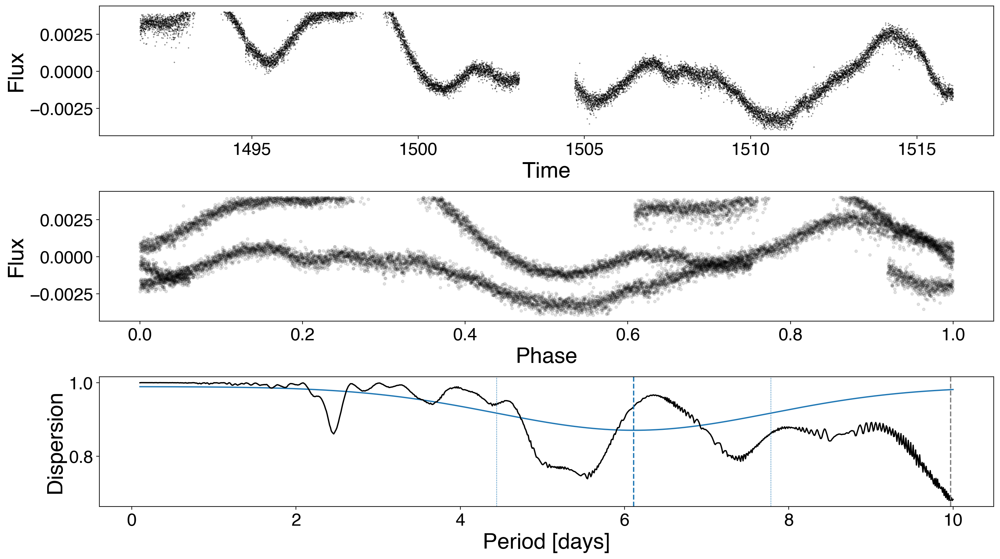

In [135]:
rotate_tess_ys6.pdm_plot();

In [136]:
star_th_5 = eleanor.Source(tic ='173673173')
data_th_5 = eleanor.TargetData(star_th_5, do_psf=True, do_pca=True)

q_th_5 = data_th_5.quality == 0

plt.figure(figsize=(14,4))
plt.plot(data_th_5.time[q], data_th_5.raw_flux[q]/np.nanmedian(data_th_5.raw_flux[q])-0.005, 'maroon', lw=3,
        label='RAW')
plt.plot(data_th_5.time[q], data_th_5.corr_flux[q]/np.nanmedian(data_th_5.corr_flux[q])+0.015, 'skyblue', lw=3,
        label='CORR')
plt.ylim(0.98,1.02)
plt.xlabel('time')
plt.ylabel('normalized flux')
plt.legend();

Set MJD-OBS to 58516.856819 from DATE-OBS.
Set DATE-BEG to '2019-02-02T20:34:58.334' from MJD-BEG'. [astropy.wcs.wcs]
/Users/ilanadoran/opt/anaconda3/lib/python3.7/site-packages/tensorflow-1.14.0-py3.7-macosx-10.9-x86_64.egg/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/ilanadoran/opt/anaconda3/lib/python3.7/site-packages/tensorflow-1.14.0-py3.7-macosx-10.9-x86_64.egg/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/ilanadoran/opt/anaconda3/lib/python3.7/site-packages/tensorflow-1.14.0-py3.7-macosx-10.9-x86_64.egg/tensorflow/python/framework/dtypes.py:518: FutureWar

/Users/ilanadoran/opt/anaconda3/lib/python3.7/site-packages/tensorboard-1.14.0-py3.7.egg/tensorboard/compat/tensorflow_stub/dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/ilanadoran/opt/anaconda3/lib/python3.7/site-packages/tensorboard-1.14.0-py3.7.egg/tensorboard/compat/tensorflow_stub/dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/ilanadoran/opt/anaconda3/lib/python3.7/site-packages/tensorboard-1.14.0-py3.7.egg/tensorboard/compat/tensorflow_stub/dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'

NameError: name 'q' is not defined

<Figure size 1008x288 with 0 Axes>

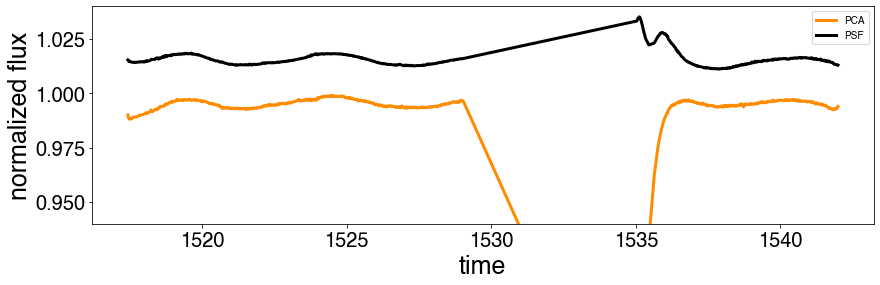

In [137]:
plt.figure(figsize=(14,4))
plt.plot(data_th_5.time[q_th_5], data_th_5.pca_flux[q_th_5]/np.nanmedian(data_th_5.pca_flux[q_th_5])-0.005, 'darkorange', lw=3, 
        label='PCA')
plt.plot(data_th_5.time[q_th_5], data_th_5.psf_flux[q_th_5]/np.nanmedian(data_th_5.psf_flux[q_th_5])+0.015, 'k', lw=3,
        label='PSF')
plt.ylim(0.94,1.04)
plt.xlabel('time')
plt.ylabel('normalized flux')
plt.legend();

0.5

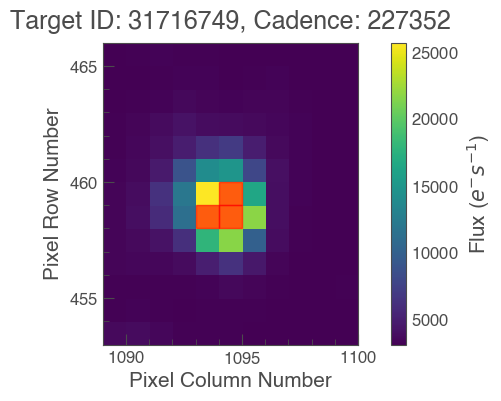

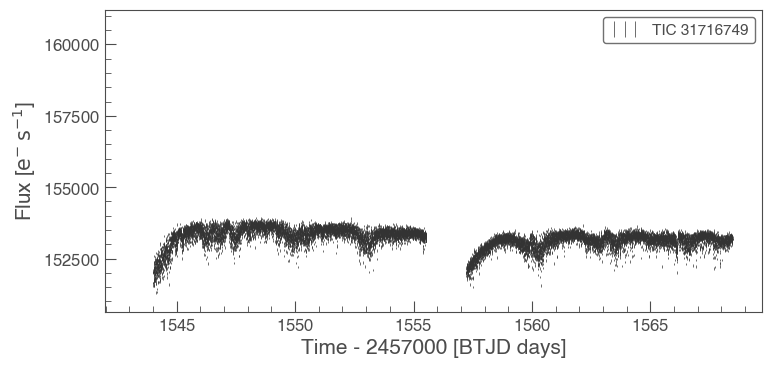

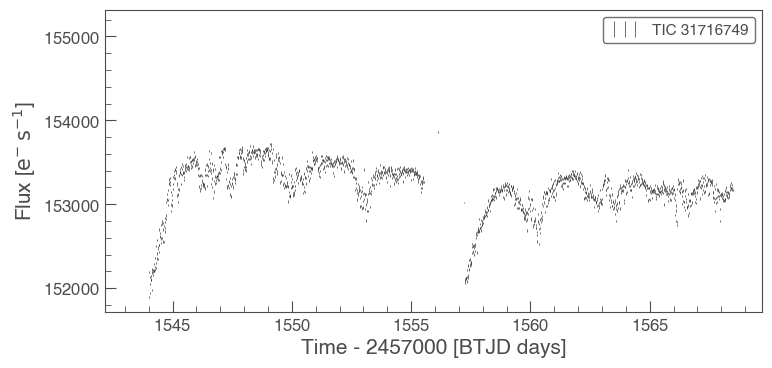

In [138]:
star_th_6 = search_result_thirty[6].download_all(quality_bitmask='default')
#star_th_6.interact()
#star_th_6.interact_sky()

target_mask__th_6 = star_th_6[1].create_threshold_mask(threshold=150, reference_pixel='center')
star_th_6[1].plot(aperture_mask=target_mask__th_6, mask_color='r');

lc_th_6 = star_th_6[1].to_lightcurve(aperture_mask=target_mask__th_6)
lc_th_6.errorbar()

lc__th_6 = lc_th_6[(star_th_6[1].time < 1529) | (star_th_6[1].time > 1536)]
lc__th_6.remove_outliers(sigma=6).bin(binsize=10).errorbar();

young_star_names.append(lc__th_6)
young_stars[thirty_m_cadence[5]]

In [139]:
ac_th_6 = ac_mcquillan_set_k(young_star_names[10])
plt.scatter(ac_th_6[1], ac_th_6[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('Autocorrelated Star 6 (30m cadence)', fontsize = 25)

TypeError: cannot unpack non-iterable numpy.int64 object

In [140]:
tess_ys5 = (search_result_thirty[6]).download_all(quality_bitmask='default')
print(tess_ys5[0].targetid)

31716749


In [141]:
tpf_ys5 = tess_ys5[0].to_lightcurve(aperture_mask=tess_ys5[0].pipeline_mask)

In [142]:
flux_nans_ys5 = tpf_ys5.flux[0:]
ys5_time = tpf_ys5.time[0:]
norm_flux_err_ys5 = tpf_ys5.flux_err[0:]
    
flux_mask_ys5 = astat.sigma_clip(flux_nans_ys5, sigma=2, masked = True)
flux_ys5 = flux_nans_ys5[~flux_mask_ys5.mask]
ys5_time = ys5_time[~flux_mask_ys5.mask]
flux_err_ys5 = norm_flux_err_ys5[~flux_mask_ys5.mask]
    
med_ys5 = np.median(flux_ys5)
flux_normalized_ys5 = flux_ys5[0:]/med_ys5 - 1
norm_flux_err_ys5 = flux_err_ys5[0:]/med_ys5

tess_time_ys5_tess = ys5_time
tess_flux_ys5_tess = flux_normalized_ys5
tess_flux_error_ys5_tess = norm_flux_err_ys5

Text(0, 0.5, 'Normalized Flux')

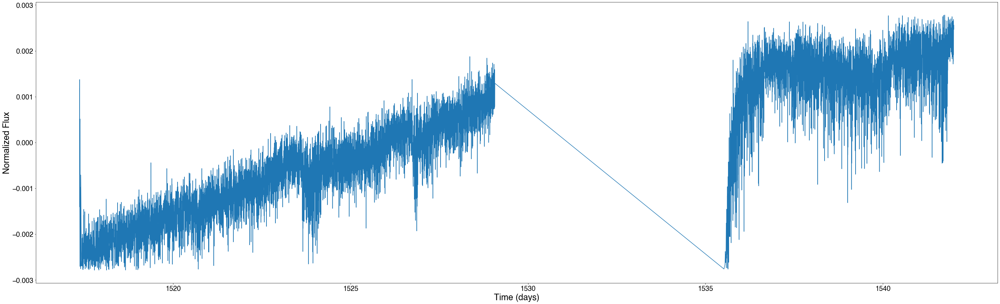

In [143]:
plt.figure(figsize=(50,15))
plt.plot(tess_time_ys5_tess, tess_flux_ys5_tess)
plt.xlabel('Time (days)')
plt.ylabel('Normalized Flux')

In [ ]:
acf_tess_ys5 = ac_mq_tess("136.6618, -43.4920", 1000);

plt.figure(figsize=(10,5))
plt.scatter(acf_tess_ys5[1], acf_tess_ys5[0])
plt.xlabel('tau', fontsize = 20)
plt.ylabel('AC', fontsize = 20)
plt.title('TESS Autocorrelated Th6', fontsize = 25)

In [144]:
rotate_tess_ys5 = ss.RotationModel(tess_time_ys5_tess, tess_flux_ys5_tess, tess_flux_error_ys5_tess)

In [145]:
exo_ys5 = exoplanet.lomb_scargle_estimator(tess_time_ys5_tess, tess_flux_ys5_tess, yerr=  tess_flux_error_ys5_tess, max_period= 10, max_peaks=2)

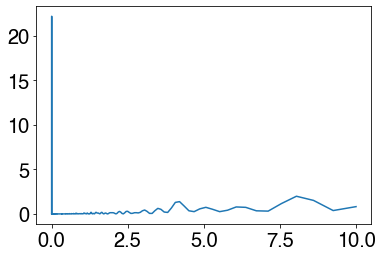

In [146]:
plt.plot(1/(exo_ys5['periodogram'][0]), exo_ys5['periodogram'][1])

13.039855412637312


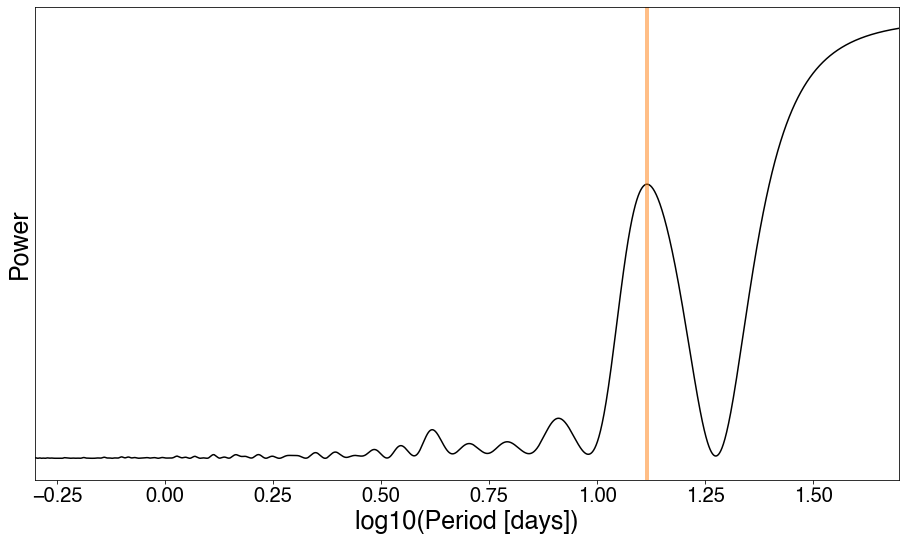

In [147]:
tess_period_ys5_tess = rotate_tess_ys5.ls_rotation()
print(tess_period_ys5_tess)
rotate_tess_ys5.ls_plot();

In [148]:
period_grid_tessys5_tess = np.linspace(.1, 10, 1000)
pdm_period_tessys5_tess, period_err_tessys5_tess = rotate_tess_ys5.pdm_rotation(period_grid_tessys5_tess, pdm_nbins=10)
print(pdm_period_tessys5_tess, period_err_tessys5_tess)

100%|██████████| 1000/1000 [00:17<00:00, 57.23it/s]

8.206306306306306 0.5667523901446353


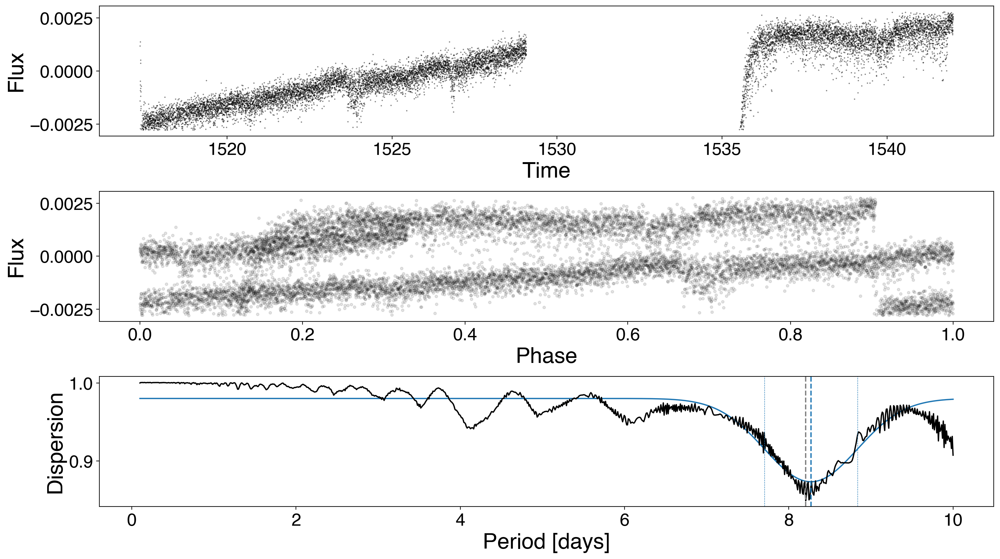

In [149]:
rotate_tess_ys5.pdm_plot();

Set MJD-OBS to 58542.731815 from DATE-OBS.
Set DATE-BEG to '2019-02-28T17:34:58.033' from MJD-BEG'. [astropy.wcs.wcs]
100%|██████████| 1154/1154 [00:26<00:00, 42.78it/s]


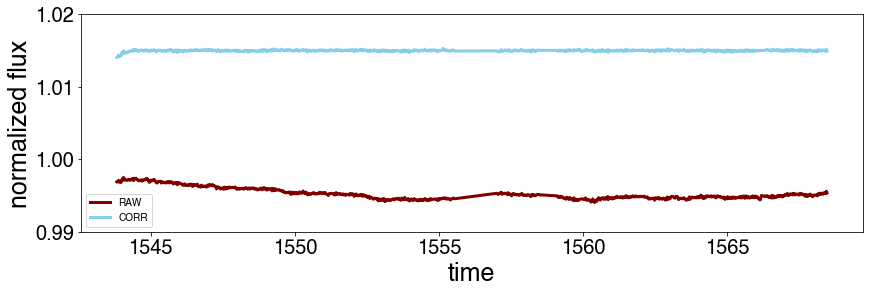

In [150]:
star_th_6 = eleanor.Source(tic ='31716749')
data_th_6 = eleanor.TargetData(star_th_6, do_psf=True, do_pca=True)

q_th_6 = data_th_6.quality == 0

plt.figure(figsize=(14,4))
plt.plot(data_th_6.time[q_th_6], (data_th_6.raw_flux[q_th_6]/np.nanmedian(data_th_6.raw_flux[q_th_6])-0.005), 'maroon', lw=3,
        label='RAW')
plt.plot(data_th_6.time[q_th_6], data_th_6.corr_flux[q_th_6]/np.nanmedian(data_th_6.corr_flux[q_th_6])+0.015, 'skyblue', lw=3,
        label='CORR')
plt.ylim(0.99,1.02)
plt.xlabel('time')
plt.ylabel('normalized flux')
plt.legend();

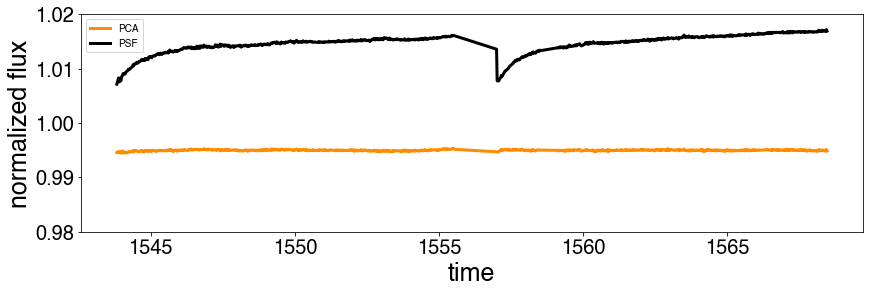

In [151]:
plt.figure(figsize=(14,4))
plt.plot(data_th_6.time[q_th_6], data_th_6.pca_flux[q_th_6]/np.nanmedian(data_th_6.pca_flux[q_th_6])-0.005, 'darkorange', lw=3, 
        label='PCA')
plt.plot(data_th_6.time[q_th_6], data_th_6.psf_flux[q_th_6]/np.nanmedian(data_th_6.psf_flux[q_th_6])+0.015, 'k', lw=3,
        label='PSF')
plt.ylim(0.98,1.02)
plt.xlabel('time')
plt.ylabel('normalized flux')
plt.legend();

In [ ]:
star_lk = (tic).download_all(quality_bitmask='default')
    tick = star_lk[0].targetid

    try:
        star = eleanor.Source(tic=tick)
        data = eleanor.TargetData(star, do_psf=True, do_pca=True)

        q = data.quality == 0
        time = data.time[q] 
        flux_nan = (data.pca_flux[q])[~np.isnan(data.pca_flux[q])]
        norm_flux = data.pca_flux[q]/np.nanmedian(data.pca_flux[q])
        
        mask = (time <= 1696) & (time >= 1692)
        norm_flux_2 = norm_flux[~mask]
        time_masked = time[~mask]
    
        mask_2 = (time_masked <= 1708) & (time_masked >= 1705)
        norm_flux = norm_flux_2[~mask_2]
        time = time_masked[~mask_2]

        norm_flux_err = np.sqrt(norm_flux)
                        
    
        resid = residuals(time, norm_flux, norm_flux_err)
        resid = resid[~np.isnan(resid)]
        time = time[~np.isnan(resid)]   
        
        #linear interpolation
        f = interpolate.interp1d(time, resid)
        xnew = np.arange(time[0], time[-1], 0.1)
        flux = f(xnew) 
        flux_err = np.sqrt(flux)
    
        fig, axs = plt.subplots()
        fig.tight_layout(h_pad=6)
        plt.figure(figsize=(15,5))
        plt.plot(xnew, flux, 'k')
        fig.savefig('solar_twin_flux_{0}.jpg'.format(each))
        plt.close(fig)

        #exo acf
        ex_1 = exoplanet.autocorr_estimator(xnew, flux, yerr= flux_err, min_period = 0.1, max_period = 15)
        exo_period = ex_1['peaks'][0]['period'] 
        exo_young_stars_thirty.append(exo_period)
        
        
        #lomb-scargle 
        rotate_el = ss.RotationModel(xnew, flux, flux_err)
        ls_period = rotate_el.ls_rotation()
        ls_young_stars_thirty.append(ls_period)
        
        #pdm 
        period_grid = np.linspace(.1, 10, 1000)
        pdm_period, period_err = rotate_el.pdm_rotation(period_grid, pdm_nbins=10)
        pdm_young_stars_thirty.append(pdm_period)
        print('works!')
        